# NLP Coursework 
Paul Caprariu (apc4818), Maxim Fishman (maf221), Clarence Ng (cn21)

This notebook contains the code for exploratory data analysis, model training, and results analysis for the approaches that we used. 

The notebook is written to be run in Google Colab. 

**Required files (to be loaded into the /content folder:**
1. dev_semeval_parids-labels.csv
2. train_semeval_parids-labels.csv
3. dontpatronizeme_categories.tsv
4. dontpatronizeme_pcl.tsv
5. task4_test.tsv (Only if running the CodaLab submission snippet)

It is organised as follows: 
1. **Imports and Data Loading**: We install and load key libraries, and load the PCL dataset. 
2. **Exploratory Analysis**: We explore the datasets. *Before running this step, the datasets should be loaded into the /content folder*
3. **RoBERTa Baseline**: We reproduce the RoBERTa baseline provided by the contest organisers.
4. **Data Augmentation and Prep**: Functions for preparing the dataset for model training, including data augmentation via synonym replacement, dataset balancing, and preparing the validation set for hyperparameter tuning. 
5. **Hyperparameter Search**: Explores different model configurations and hyperparameters to find the best performing option. 
6. **Final Model**: We take the best performing configuration from the hyperparameter search and retrain the model with the entire training set. 
7. **Results Analysis**: We analyse the results of the final model in further detail. 
8. **Codalab Submission**: Code to generate outputs for the Codalab test set. 
9. **Alternative Approach Explored: Textual Entailment**: An alternate approach that we explored using textual entailment for feature construction. Unfortunately this did not prouce viable results

# Main imports


In [ ]:
# check which gpu we're using
!nvidia-smi

Fri Mar  4 13:23:58 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   31C    P0    23W / 300W |      0MiB / 16160MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!pip install simpletransformers
!pip install tensorboardx

In [ ]:
from simpletransformers.classification import ClassificationModel, ClassificationArgs, MultiLabelClassificationModel, MultiLabelClassificationArgs
from urllib import request
import pandas as pd
import numpy as np
import logging
import torch
import wandb
from collections import Counter
from ast import literal_eval

In [ ]:
# prepare logger
logging.basicConfig(level=logging.INFO)

transformers_logger = logging.getLogger("transformers")
transformers_logger.setLevel(logging.WARNING)

# check gpu
cuda_available = torch.cuda.is_available()

print('Cuda available? ',cuda_available)

Cuda available?  True


In [ ]:
if cuda_available:
  import tensorflow as tf
  # Get the GPU device name.
  device_name = tf.test.gpu_device_name()
  # The device name should look like the following:
  if device_name == '/device:GPU:0':
      print('Found GPU at: {}'.format(device_name))
  else:
      raise SystemError('GPU device not found')

Found GPU at: /device:GPU:0


In [ ]:
def eval_metrics(output, gold, print_metrics = True):
  ############################################
  # Note: Adapted from f1-measure code in lab02 solutions
  # Returns recall, precision, f1 for positive class
  ############################################
     
  test_pos_preds = np.sum(output)
  test_pos_real = np.sum(gold)
    
  pos_correct = (np.logical_and(output, gold)).astype(int)
  pos_correct = np.sum(pos_correct)
  
  precision = pos_correct / test_pos_preds
  recall = pos_correct / test_pos_real
  
  fscore = (2.0 * precision * recall) / (precision + recall)

  # Print them
  if print_metrics: 
    print(f"     Recall: {recall:.2f}, Precision: {precision:.2f}, F-measure: {fscore:.2f}")

  return recall, precision, fscore

# Fetch Don't Patronize Me! data manager module

In [ ]:
module_url = f"https://raw.githubusercontent.com/Perez-AlmendrosC/dontpatronizeme/master/semeval-2022/dont_patronize_me.py"
module_name = module_url.split('/')[-1]
print(f'Fetching {module_url}')
#with open("file_1.txt") as f1, open("file_2.txt") as f2
with request.urlopen(module_url) as f, open(module_name,'w') as outf:
  a = f.read()
  outf.write(a.decode('utf-8'))

Fetching https://raw.githubusercontent.com/Perez-AlmendrosC/dontpatronizeme/master/semeval-2022/dont_patronize_me.py


In [ ]:
# helper function to save predictions to an output file
def labels2file(p, outf_path):
	with open(outf_path,'w') as outf:
		for pi in p:
			outf.write(','.join([str(k) for k in pi])+'\n')

In [ ]:
from dont_patronize_me import DontPatronizeMe

In [ ]:
dpm = DontPatronizeMe('.', '.')

In [ ]:
dpm.load_task1()

In [ ]:
# Check the length!! Sometimes file uploads to colab get truncated. Correct value is 10469

len(dpm.train_task1_df)

10469

# Load paragraph IDs

In [ ]:
trids = pd.read_csv('train_semeval_parids-labels.csv')
teids = pd.read_csv('dev_semeval_parids-labels.csv')

In [ ]:
trids.head()

,par_id,label
0,4341,"[1, 0, 0, 1, 0, 0, 0]"
1,4136,"[0, 1, 0, 0, 0, 0, 0]"
2,10352,"[1, 0, 0, 0, 0, 1, 0]"
3,8279,"[0, 0, 0, 1, 0, 0, 0]"
4,1164,"[1, 0, 0, 1, 1, 1, 0]"


In [ ]:
trids.par_id = trids.par_id.astype(str)
teids.par_id = teids.par_id.astype(str)

# Rebuild training set (Task 1)

In [ ]:
rows = [] # will contain par_id, label and text
for idx in range(len(trids)):  
  parid = trids.par_id[idx]
  #print(parid)
  # select row from original dataset to retrieve `text` and binary label
  text = dpm.train_task1_df.loc[dpm.train_task1_df.par_id == parid].text.values[0]
  label = dpm.train_task1_df.loc[dpm.train_task1_df.par_id == parid].label.values[0]
  rows.append({
      'par_id':parid,
      'text':text,
      'label':label
  })
  

In [ ]:
trdf1 = pd.DataFrame(rows)

# Rebuild test set (Task 1)

In [ ]:
rows = [] # will contain par_id, label and text
for idx in range(len(teids)):  
  parid = teids.par_id[idx]
  #print(parid)
  # select row from original dataset
  text = dpm.train_task1_df.loc[dpm.train_task1_df.par_id == parid].text.values[0]
  label = dpm.train_task1_df.loc[dpm.train_task1_df.par_id == parid].label.values[0]
  rows.append({
      'par_id':parid,
      'text':text,
      'label':label
  })
  

In [ ]:
tedf1 = pd.DataFrame(rows)

## Exploratory Analysis

In [ ]:
import matplotlib.pyplot as plt
from scipy import stats
import numpy as np


def cramers_corrected_stat(x, y):
  """ Cramer's V statistic; uses correction from Bergsma and Wicher.
      Journal of the Korean Statistical Society 42 (2013): 323-328
  """
  conf_matrix = pd.crosstab(x, y)

  chi2 = stats.chi2_contingency(conf_matrix)[0]

  n = sum(conf_matrix.sum())
  phi2 = chi2 / n
  k, r = conf_matrix.shape
  phi2corr = max(0, phi2 - ((k - 1) * (r - 1)) / (n - 1))    
  rcorr = r - ((r - 1) ** 2)/ (n-1)
  kcorr = k - ((k - 1) ** 2)/ (n-1)
  result = np.sqrt(phi2corr / min((kcorr - 1), (rcorr - 1)))
  return result

In [ ]:
train_analysis_set = dpm.train_task1_df.copy()
print(train_analysis_set.columns.tolist())
train_analysis_set['text'] = train_analysis_set['text'].apply(lambda x: len(x.split()))

['par_id', 'art_id', 'keyword', 'country', 'text', 'label', 'orig_label']


In [ ]:
print("Point biserial correlation between label and input length:", stats.pointbiserialr(train_analysis_set['label'], train_analysis_set['text'])[0])
print("Cramer's V between label and keyword:                 ", cramers_corrected_stat(train_analysis_set['label'], train_analysis_set['keyword']))
print("Cramer's V between label and country:                 ", cramers_corrected_stat(train_analysis_set['label'], train_analysis_set['country']))
print("Cramer's V between label and orig_label:              ", cramers_corrected_stat(train_analysis_set['label'], train_analysis_set['orig_label']))
print("Cramer's V between country and keyword:               ", cramers_corrected_stat(train_analysis_set['country'], train_analysis_set['keyword']))

Point biserial correlation between label and input length: 0.057842036425582534
Cramer's V between label and keyword:                  0.17312760725659082
Cramer's V between label and country:                  0.059372886242834155
Cramer's V between label and orig_label:               0.9998566821920264
Cramer's V between country and keyword:                0.01266812512878428


In [ ]:
print(train_analysis_set.groupby('country')['label'].value_counts(normalize=True))
print(train_analysis_set['country'].value_counts('label'))

country  label
au       0        0.931608
         1        0.068392
bd       0        0.914062
         1        0.085938
ca       0        0.913208
         1        0.086792
gb       0        0.894444
         1        0.105556
gh       0        0.856597
         1        0.143403
hk       0        0.940816
         1        0.059184
ie       0        0.903166
         1        0.096834
in       0        0.926415
         1        0.073585
jm       0        0.883673
         1        0.116327
ke       0        0.916512
         1        0.083488
lk       0        0.902778
         1        0.097222
my       0        0.921245
         1        0.078755
ng       0        0.865922
         1        0.134078
nz       0        0.909266
         1        0.090734
ph       0        0.877064
         1        0.122936
pk       0        0.902752
         1        0.097248
sg       0        0.928972
         1        0.071028
tz       0        0.901205
         1        0.098795
us       0   

In [ ]:
print(train_analysis_set.groupby('keyword')['label'].value_counts(normalize=True))
print(train_analysis_set['keyword'].value_counts('label'))

keyword        label
disabled       0        0.921206
               1        0.078794
homeless       0        0.834726
               1        0.165274
hopeless       0        0.876617
               1        0.123383
immigrant      0        0.971725
               1        0.028275
in-need        0        0.837338
               1        0.162662
migrant        0        0.966942
               1        0.033058
poor-families  0        0.834983
               1        0.165017
refugee        0        0.919476
               1        0.080524
vulnerable     0        0.925926
               1        0.074074
women          0        0.951402
               1        0.048598
Name: label, dtype: float64
migrant          0.104021
in-need          0.103353
vulnerable       0.103162
homeless         0.102875
women            0.102207
refugee          0.102015
immigrant        0.101347
disabled         0.098195
hopeless         0.095998
poor-families    0.086828
Name: keyword, dtype: float64


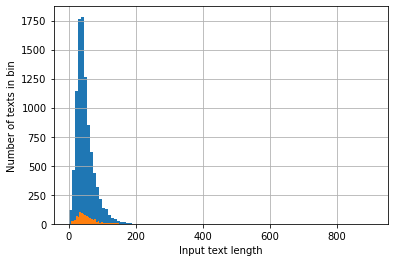

In [ ]:
x = train_analysis_set.groupby('label')['text'].hist(bins=101)
x[0].set_xlabel("Input text length")
x[0].set_ylabel("Number of texts in bin")
plt.show()

In [ ]:
pd.set_option('max_columns', None, 'max_rows', None)
train_analysis_set[train_analysis_set.columns.difference(['text'])] = train_analysis_set[train_analysis_set.columns.difference(['text'])].apply(lambda x: pd.factorize(x)[0])
print(train_analysis_set.corr())
print(train_analysis_set.groupby('keyword')['label'].value_counts(normalize=True))
#print(trdf1.groupby('country')['keyword'].value_counts(normalize=True))

              par_id    art_id   keyword   country      text     label  \
par_id      1.000000  0.964479  0.002705  0.008952 -0.005955 -0.007455   
art_id      0.964479  1.000000  0.008841 -0.013708  0.002257 -0.004429   
keyword     0.002705  0.008841  1.000000  0.012896 -0.029558  0.060319   
country     0.008952 -0.013708  0.012896  1.000000  0.026640 -0.024340   
text       -0.005955  0.002257 -0.029558  0.026640  1.000000  0.057842   
label      -0.007455 -0.004429  0.060319 -0.024340  0.057842  1.000000   
orig_label -0.007188 -0.003960  0.068098 -0.019021  0.074446  0.932998   

            orig_label  
par_id       -0.007188  
art_id       -0.003960  
keyword       0.068098  
country      -0.019021  
text          0.074446  
label         0.932998  
orig_label    1.000000  
keyword  label
0        0        0.876617
         1        0.123383
1        0        0.966942
         1        0.033058
2        0        0.971725
         1        0.028275
3        0        0.921206
   

In [ ]:
# Get label counts

print(trdf1.value_counts('label'))
print(trdf1.value_counts('label', normalize = True))

label
0    7581
1     794
dtype: int64
label
0    0.905194
1    0.094806
dtype: float64


In [ ]:
# See some samples
pd.set_option('display.max_colwidth', -1)

print("Texts tagged as CONTAINING PCL")
print(trdf1[trdf1.label == 1].sample(10, random_state=1)["text"])

print("\nTexts tagged as NOT CONTAINING PCL")
print(trdf1[trdf1.label == 0].sample(10, random_state=1)["text"])


Texts tagged as CONTAINING PCL
8      A harrowing journey Night falls early in this part of Morocco now and a cold winter looms , prompting the homeless Africans to take their chances before conditions worsen , and amid sometimes harsh treatment by authorities .                                                                                                                                                                          
551    On hunger , homelessness , disease : This is the lot of the poor and unwashed . Accepted na ( they 're expendable ) .                                                                                                                                                                                                                                                                                     
175    Even people who are disabled can still practice karate and have a sense of accomplishment . It matters not what your state of being is , people are encouraged

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  


# RoBERTa Baseline for Task 1

In [ ]:
### DO NOT TOUCH

# Code is from roberta baseline colab notebook that was provided
# Reproduces baseline results
#
# We will save the predictions from here to compare with our models later

pcldf = trdf1[trdf1.label==1]
npos = len(pcldf)

training_set1 = pd.concat([pcldf,trdf1[trdf1.label==0][:npos*2]])

task1_model_args = ClassificationArgs(num_train_epochs=1, 
                                      no_save=True, 
                                      no_cache=True, 
                                      manual_seed = 1, #Added for reproducibility
                                      overwrite_output_dir=True)
task1_model = ClassificationModel("roberta", 
                                  'roberta-base',
                                  args = task1_model_args, 
                                  num_labels=2, 
                                  use_cuda=cuda_available)
task1_model.train_model(training_set1[['text', 'label']])
preds_task1, _ = task1_model.predict(tedf1.text.tolist())

Downloading:   0%|          | 0.00/481 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/478M [00:00<?, ?B/s]

Some weights of the model checkpoint at roberta-base were not used when initializing RobertaForSequenceClassification: ['lm_head.layer_norm.weight', 'lm_head.dense.bias', 'lm_head.bias', 'roberta.pooler.dense.weight', 'roberta.pooler.dense.bias', 'lm_head.dense.weight', 'lm_head.decoder.weight', 'lm_head.layer_norm.bias']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.

Downloading:   0%|          | 0.00/878k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/446k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.29M [00:00<?, ?B/s]

/usr/local/lib/python3.7/dist-packages/simpletransformers/classification/classification_model.py:586: UserWarning: Dataframe headers not specified. Falling back to using column 0 as text and column 1 as labels.
  "Dataframe headers not specified. Falling back to using column 0 as text and column 1 as labels."
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2382 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:309: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,


Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Running Epoch 0 of 1:   0%|          | 0/298 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

In [ ]:
from sklearn.metrics import f1_score, confusion_matrix
print(f1_score(tedf1["label"], preds_task1))
print(confusion_matrix(tedf1["label"], preds_task1, normalize="true"))

# Save results
eval_metrics(preds_task1, tedf1.label)
tedf1["roberta_base_pred"] = preds_task1

0.47058823529411764
[[0.8237467 0.1762533]
 [0.1758794 0.8241206]]
     Recall: 0.82, Precision: 0.33, F-measure: 0.47


In [ ]:
print("Examples of true negatives:")
print(tedf1[(tedf1["label"] == preds_task1) & (tedf1["label"] == 0)].sample(10, random_state=1)["text"])
print("Examples of true positives:")
print(tedf1[(tedf1["label"] == preds_task1) & (tedf1["label"] == 1)].sample(10, random_state=1)["text"])
print("Examples of false positives:")
print(tedf1[(tedf1["label"] != preds_task1) & (tedf1["label"] == 0)].sample(10, random_state=1)["text"])
print("Examples of false negatives:")
print(tedf1[(tedf1["label"] != preds_task1) & (tedf1["label"] == 1)].sample(10, random_state=1)["text"])

Examples of true negatives:
2053    BISP since its inception has emerged as one of the best social safety nets in the world catering to the 5.3 million poor families all across Pakistan . United Kingdom 's Department for International Development ( DFID ) was also part of the mission . The mission held its review of the Program in Islamabad from 5th -9th September 2016.                                                                                                                                                                                                                                        
626     In Photo : Sheila Warren ( center ) and Martha Lackritz-Peltier , lawyers waiting to provide legal assistance to families dealing with the aftermath of President Donald J. Trump 's executive order , are in the international arrivals area of San Francisco International Airport on January 30 . Lawyers affiliated with refugee organizations or acting on their own were at about a dozen air

# Data Augmentation - Synonym Replacement

In [ ]:
from nltk.corpus import wordnet, stopwords
import nltk
import random

nltk.download('stopwords')
nltk.download('wordnet')

stop_words = set(stopwords.words('english'))

def get_synonyms(word):
    """
    Get synonyms of a word
    """
    synonyms = set()
    
    for syn in wordnet.synsets(word): 
        for l in syn.lemmas(): 
            synonym = l.name().replace("_", " ").replace("-", " ").lower()
            synonym = "".join([char for char in synonym if char in ' qwertyuiopasdfghjklzxcvbnm'])
            synonyms.add(synonym) 
    
    if word in synonyms:
        synonyms.remove(word)
    
    return list(synonyms)

def synonym_replacement(words, n):
    
    words = words.split()
    
    new_words = words.copy()
    random_word_list = list(set([word for word in words if word not in stop_words]))
    random.shuffle(random_word_list)
    num_replaced = 0
    
    for random_word in random_word_list:
        synonyms = get_synonyms(random_word)
        
        if len(synonyms) >= 1:
            synonym = random.choice(list(synonyms))
            new_words = [synonym if word == random_word else word for word in new_words]
            num_replaced += 1
        
        if num_replaced >= n: #only replace up to n words
            break

    sentence = ' '.join(new_words)

    return sentence

def do_synonym_replacement_augmentation(df, words_to_replace=0, multiple_to_add_positive=8, multiple_to_add_negative = 2):
    if multiple_to_add_positive != 0: 
      to_add = df.loc[df.index.repeat(multiple_to_add_positive)]
      to_add = to_add[to_add.label == 1]
      to_add['text'] = to_add['text'].apply(synonym_replacement, n = words_to_replace)
      df = pd.concat([df, to_add])
    if multiple_to_add_negative != 0:
      to_add = df.loc[df.index.repeat(multiple_to_add_negative)]
      to_add = to_add[to_add.label == 0]
      to_add['text'] = to_add['text'].apply(synonym_replacement, n = words_to_replace)
      df = pd.concat([df, to_add])

    return df.sample(frac = 1)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


# Data Prep - Dataset Balancing and Validation Set

In [ ]:
def enforce_max_ratio(trdf, max_ratio = 2):
  max_size = trdf['label'].value_counts().max()
  lst = [trdf]
  for class_index, group in trdf.groupby('label'):
      lst.append(group.sample(max_size-len(group), replace=True))
  frame_new = pd.concat(lst)
  return frame_new

In [ ]:
# Separate validation set for use in hyperparameter search
# 25% of train set ~= 20% of total training data

# Hyperparameter tuning loop will use trdf2 for training and vadf2 for validation. 
# Final training run will use the full trdf1
n = len(trdf1)
cutoff = int(np.round(n * 0.75))
np.random.seed(1)
indices = np.random.permutation(n)
trdf2, vadf2 = trdf1.loc[indices[:cutoff,]], trdf1.loc[indices[cutoff:,],]

# Hyperparameter Tuning

In [ ]:
### CONFIGURE OPTIONS HERE

sweep_config = {
    "method": "random",  # bayes, grid, random
    "metric": {"name": "my_val_f1", "goal": "maximize"},
    "parameters": {
        "num_train_epochs": {"values": [5, 10, 15, 20]},
        "learning_rate": {"values": [1e-6, 5e-6, 5e-5, 1e-4]},
        "train_batch_size": {"values": [32, 64, 128]},      

        #Augmentation
        "multiple_to_add_positive": {"values": [0, 2, 8, 16]},
        "multiple_to_add_negative": {"values": [0, 1, 2]},
        "words_to_replace": {"values": [4, 8, 16]},

        # Other Stuff
        "model": {"values": [ ["roberta", "roberta-base"], 
                             ["xlnet", "xlnet-base-cased"]]},
        "max_ratio": {"values": [2, 4, 10]}, 
    },
}

sweep_id = wandb.sweep(sweep_config, project="Random Sweep 2Mar")

<IPython.core.display.Javascript object>

wandb: You can find your API key in your browser here: https://wandb.ai/authorize


wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: ··········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Create sweep with ID: lz9wxrf5
Sweep URL: https://wandb.ai/the-tuners/Random%20Sweep%202Mar/sweeps/lz9wxrf5


In [ ]:
model_args = ClassificationArgs(no_save=True, 
                                      no_cache=True, 
                                      overwrite_output_dir=True)
model_args.manual_seed = 1
model_args.use_multiprocessing = True
model_args.labels_list = [0, 1]

In [ ]:
def train():
    # Initialize a new wandb run
    wandb.init()

    # Prepare Train Data
    training_set = do_synonym_replacement_augmentation(trdf2, words_to_replace = wandb.config['words_to_replace'], 
                                                       multiple_to_add_positive = wandb.config['multiple_to_add_positive'],
                                                       multiple_to_add_negative = wandb.config['multiple_to_add_negative'])
    training_set = enforce_max_ratio(training_set, max_ratio = wandb.config["max_ratio"])

    # Create a TransformerModel
    model = ClassificationModel(
        wandb.config["model"][0],
        wandb.config["model"][1],
        use_cuda=cuda_available,
        args=model_args,
        num_labels = 2,
        sweep_config=wandb.config,
    )

    # Train the model
    model.train_model(training_set[["text", "label"]])

    # Evaluate the model on validation set
    original_preds, raw_outputs = model.predict(vadf2.text.tolist())
    recall, precision, f1 = eval_metrics(original_preds, vadf2.label)
    cutoff = 0
    for i in range(60):
      threshold = (-1.5 + i*0.05)
      tmp = [1 if x[1] > threshold else 0 for x in raw_outputs]
      tmp_recall, tmp_precision, tmp_f1 = eval_metrics(tmp, vadf2.label, print_metrics = False)
      if tmp_f1 > f1: 
        recall, precision, f1 = tmp_recall, tmp_precision, tmp_f1
        cutoff = threshold

    wandb.log({'my_val_precision': precision, 'my_val_recall': recall, 'my_val_f1': f1, 'prediction_cutoff': cutoff})

    # Evaluate the model on test set
    _, raw_outputs = model.predict(tedf1.text.tolist())
    updated_pred = [1 if x[1] > cutoff else 0 for x in raw_outputs]
    recall, precision, f1 = eval_metrics(updated_pred, tedf1.label)

    wandb.log({'my_test_precision': precision, 'my_test_recall': recall, 'my_test_f1': f1})

    # Sync wandb
    wandb.join()

In [ ]:
wandb.agent(sweep_id, train)

wandb: Agent Starting Run: iedbs5nr with config:
wandb: 	learning_rate: 1e-06
wandb: 	max_ratio: 10
wandb: 	model: ['xlnet', 'xlnet-base-cased']
wandb: 	multiple_to_add_negative: 0
wandb: 	multiple_to_add_positive: 16
wandb: 	num_train_epochs: 20
wandb: 	train_batch_size: 64
wandb: 	words_to_replace: 4


Downloading:   0%|          | 0.00/760 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/445M [00:00<?, ?B/s]

Some weights of the model checkpoint at xlnet-base-cased were not used when initializing XLNetForSequenceClassification: ['lm_loss.bias', 'lm_loss.weight']
- This IS expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLNetForSequenceClassification were not initialized from the model checkpoint at xlnet-base-cased and are newly initialized: ['logits_proj.bias', 'sequence_summary.summary.bias', 'logits_proj.weight', 'sequence_summary.summary.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions a

Downloading:   0%|          | 0.00/779k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.32M [00:00<?, ?B/s]

/usr/local/lib/python3.7/dist-packages/simpletransformers/classification/classification_model.py:586: UserWarning: Dataframe headers not specified. Falling back to using column 0 as text and column 1 as labels.
  "Dataframe headers not specified. Falling back to using column 0 as text and column 1 as labels."
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/20468 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:309: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use thePyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,


Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Running Epoch 0 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 1 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 2 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 3 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 4 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 5 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 6 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 7 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 8 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 9 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 10 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 11 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 12 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 13 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 14 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 15 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 16 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 17 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 18 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 19 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of xlnet model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.11, Precision: 0.47, F-measure: 0.18


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.36, Precision: 0.55, F-measure: 0.43



Training loss,██▅▅▄▂▃▂▃▂▂▃▂▂▁▃▁▂▁▂▂▁▁▁▂▂▁▁▁▁▁▁▁▁▂▁▃▁▂▂
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▅███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,0.06155


wandb: Agent Starting Run: lyoa2236 with config:
wandb: 	learning_rate: 1e-06
wandb: 	max_ratio: 2
wandb: 	model: ['roberta', 'roberta-base']
wandb: 	multiple_to_add_negative: 0
wandb: 	multiple_to_add_positive: 0
wandb: 	num_train_epochs: 10
wandb: 	train_batch_size: 32
wandb: 	words_to_replace: 8


Downloading:   0%|          | 0.00/481 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/478M [00:00<?, ?B/s]

Some weights of the model checkpoint at roberta-base were not used when initializing RobertaForSequenceClassification: ['lm_head.bias', 'lm_head.dense.weight', 'lm_head.decoder.weight', 'lm_head.dense.bias', 'roberta.pooler.dense.bias', 'roberta.pooler.dense.weight', 'lm_head.layer_norm.weight', 'lm_head.layer_norm.bias']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.

Downloading:   0%|          | 0.00/878k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/446k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.29M [00:00<?, ?B/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/11358 [00:00<?, ?it/s]

Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Running Epoch 0 of 10:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 1 of 10:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 2 of 10:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 3 of 10:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 4 of 10:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 5 of 10:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 6 of 10:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 7 of 10:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 8 of 10:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 9 of 10:   0%|          | 0/355 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.70, Precision: 0.41, F-measure: 0.52


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.68, Precision: 0.44, F-measure: 0.53



Training loss,██████▆▅▅▅▄▅▃▄▃▅▃▃▄▂▂▁▄▄▃▂▁▁▁▃▂▁▃▂▂▁▂▂▂▅
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▃▅▆███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,0.42488


wandb: Agent Starting Run: e6i4je06 with config:
wandb: 	learning_rate: 1e-06
wandb: 	max_ratio: 4
wandb: 	model: ['xlnet', 'xlnet-base-cased']
wandb: 	multiple_to_add_negative: 0
wandb: 	multiple_to_add_positive: 0
wandb: 	num_train_epochs: 20
wandb: 	train_batch_size: 64
wandb: 	words_to_replace: 8


Some weights of the model checkpoint at xlnet-base-cased were not used when initializing XLNetForSequenceClassification: ['lm_loss.bias', 'lm_loss.weight']
- This IS expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLNetForSequenceClassification were not initialized from the model checkpoint at xlnet-base-cased and are newly initialized: ['logits_proj.bias', 'sequence_summary.summary.bias', 'logits_proj.weight', 'sequence_summary.summary.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions a

  0%|          | 0/11358 [00:00<?, ?it/s]

Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Running Epoch 0 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 1 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 2 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 3 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 4 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 5 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 6 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 7 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 8 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 9 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 10 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 11 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 12 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 13 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 14 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 15 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 16 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 17 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 18 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 19 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of xlnet model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.68, Precision: 0.42, F-measure: 0.52


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.70, Precision: 0.48, F-measure: 0.57



Training loss,███▇▆▅▅▅▅▅▄▄▄▃▃▃▃▃▂▅▂▂▃▃▂▂▂▁▂▃▁▄▂▂▂▃▂▁▂▃
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▃▅▆███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,0.23754


wandb: Agent Starting Run: 45i4pkux with config:
wandb: 	learning_rate: 1e-06
wandb: 	max_ratio: 2
wandb: 	model: ['roberta', 'roberta-base']
wandb: 	multiple_to_add_negative: 2
wandb: 	multiple_to_add_positive: 2
wandb: 	num_train_epochs: 5
wandb: 	train_batch_size: 128
wandb: 	words_to_replace: 16


Some weights of the model checkpoint at roberta-base were not used when initializing RobertaForSequenceClassification: ['lm_head.bias', 'lm_head.dense.weight', 'lm_head.decoder.weight', 'lm_head.dense.bias', 'roberta.pooler.dense.bias', 'roberta.pooler.dense.weight', 'lm_head.layer_norm.weight', 'lm_head.layer_norm.bias']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.

  0%|          | 0/34074 [00:00<?, ?it/s]

Epoch:   0%|          | 0/5 [00:00<?, ?it/s]

Running Epoch 0 of 5:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 1 of 5:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 2 of 5:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 3 of 5:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 4 of 5:   0%|          | 0/267 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.73, Precision: 0.30, F-measure: 0.43


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.58, Precision: 0.49, F-measure: 0.53



Training loss,███████▆▆▄▂▃▃▄▄▃▂▂▁▂▃▁▂▃▁▃
global_step,▁▁▂▂▂▂▃▃▃▄▄▄▄▅▅▅▅▆▆▆▇▇▇▇██
lr,▂▃▄▅▆▇▇██▇▇▆▆▆▅▅▅▄▄▃▃▃▂▂▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,0.37889


wandb: Agent Starting Run: zm4i0prv with config:
wandb: 	learning_rate: 0.0001
wandb: 	max_ratio: 2
wandb: 	model: ['xlnet', 'xlnet-base-cased']
wandb: 	multiple_to_add_negative: 2
wandb: 	multiple_to_add_positive: 16
wandb: 	num_train_epochs: 10
wandb: 	train_batch_size: 32
wandb: 	words_to_replace: 4


Some weights of the model checkpoint at xlnet-base-cased were not used when initializing XLNetForSequenceClassification: ['lm_loss.bias', 'lm_loss.weight']
- This IS expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLNetForSequenceClassification were not initialized from the model checkpoint at xlnet-base-cased and are newly initialized: ['logits_proj.bias', 'sequence_summary.summary.bias', 'logits_proj.weight', 'sequence_summary.summary.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions a

  0%|          | 0/34074 [00:00<?, ?it/s]

Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Running Epoch 0 of 10:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 1 of 10:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 2 of 10:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 3 of 10:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 4 of 10:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 5 of 10:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 6 of 10:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 7 of 10:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 8 of 10:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 9 of 10:   0%|          | 0/1065 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of xlnet model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.20, Precision: 0.51, F-measure: 0.29


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.31, Precision: 0.54, F-measure: 0.39



Training loss,▄▄█▄▁▁▁▁▂▁▁▁▄▁▃▂▄▁▁▁▁▁▁▁▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▇███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,0.00176


wandb: Agent Starting Run: k16eyr7l with config:
wandb: 	learning_rate: 5e-06
wandb: 	max_ratio: 2
wandb: 	model: ['roberta', 'roberta-base']
wandb: 	multiple_to_add_negative: 2
wandb: 	multiple_to_add_positive: 0
wandb: 	num_train_epochs: 10
wandb: 	train_batch_size: 128
wandb: 	words_to_replace: 16


Some weights of the model checkpoint at roberta-base were not used when initializing RobertaForSequenceClassification: ['lm_head.bias', 'lm_head.dense.weight', 'lm_head.decoder.weight', 'lm_head.dense.bias', 'roberta.pooler.dense.bias', 'roberta.pooler.dense.weight', 'lm_head.layer_norm.weight', 'lm_head.layer_norm.bias']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.

  0%|          | 0/34074 [00:00<?, ?it/s]

Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Running Epoch 0 of 10:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 1 of 10:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 2 of 10:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 3 of 10:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 4 of 10:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 5 of 10:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 6 of 10:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 7 of 10:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 8 of 10:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 9 of 10:   0%|          | 0/267 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.57, Precision: 0.42, F-measure: 0.49


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.62, Precision: 0.49, F-measure: 0.55



Training loss,██▆▂▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▂▂▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▃▄▆▇████▇▇▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▁▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,0.00042


wandb: Agent Starting Run: czp0e26u with config:
wandb: 	learning_rate: 5e-05
wandb: 	max_ratio: 10
wandb: 	model: ['roberta', 'roberta-base']
wandb: 	multiple_to_add_negative: 1
wandb: 	multiple_to_add_positive: 0
wandb: 	num_train_epochs: 10
wandb: 	train_batch_size: 128
wandb: 	words_to_replace: 8


Some weights of the model checkpoint at roberta-base were not used when initializing RobertaForSequenceClassification: ['lm_head.bias', 'lm_head.dense.weight', 'lm_head.decoder.weight', 'lm_head.dense.bias', 'roberta.pooler.dense.bias', 'roberta.pooler.dense.weight', 'lm_head.layer_norm.weight', 'lm_head.layer_norm.bias']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.

  0%|          | 0/22716 [00:00<?, ?it/s]

Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Running Epoch 0 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 1 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 2 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 3 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 4 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 5 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 6 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 7 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 8 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 9 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.51, Precision: 0.52, F-measure: 0.51


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.52, Precision: 0.59, F-measure: 0.55



Training loss,█▆▂▃▁▃▁▁▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
lr,▂▃▄▅▆▆▇██▇▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,2e-05


wandb: Agent Starting Run: lnz5dzf1 with config:
wandb: 	learning_rate: 1e-06
wandb: 	max_ratio: 10
wandb: 	model: ['xlnet', 'xlnet-base-cased']
wandb: 	multiple_to_add_negative: 1
wandb: 	multiple_to_add_positive: 8
wandb: 	num_train_epochs: 10
wandb: 	train_batch_size: 128
wandb: 	words_to_replace: 16


Some weights of the model checkpoint at xlnet-base-cased were not used when initializing XLNetForSequenceClassification: ['lm_loss.bias', 'lm_loss.weight']
- This IS expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLNetForSequenceClassification were not initialized from the model checkpoint at xlnet-base-cased and are newly initialized: ['logits_proj.bias', 'sequence_summary.summary.bias', 'logits_proj.weight', 'sequence_summary.summary.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions a

  0%|          | 0/22716 [00:00<?, ?it/s]

Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Running Epoch 0 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 1 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 2 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 3 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 4 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 5 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 6 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 7 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 8 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 9 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of xlnet model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.42, Precision: 0.45, F-measure: 0.44


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.55, Precision: 0.50, F-measure: 0.52



Training loss,███▇▇▆▅▄▄▄▄▄▃▃▄▃▂▅▃▃▃▂▂▃▃▂▂▂▃▁▁▂▃▂▄
global_step,▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
lr,▂▃▄▅▆▆▇██▇▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,0.45033


wandb: Agent Starting Run: 8ni4h0nw with config:
wandb: 	learning_rate: 5e-06
wandb: 	max_ratio: 10
wandb: 	model: ['roberta', 'roberta-base']
wandb: 	multiple_to_add_negative: 0
wandb: 	multiple_to_add_positive: 2
wandb: 	num_train_epochs: 5
wandb: 	train_batch_size: 32
wandb: 	words_to_replace: 4


Some weights of the model checkpoint at roberta-base were not used when initializing RobertaForSequenceClassification: ['lm_head.bias', 'lm_head.dense.weight', 'lm_head.decoder.weight', 'lm_head.dense.bias', 'roberta.pooler.dense.bias', 'roberta.pooler.dense.weight', 'lm_head.layer_norm.weight', 'lm_head.layer_norm.bias']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.

  0%|          | 0/11358 [00:00<?, ?it/s]

Epoch:   0%|          | 0/5 [00:00<?, ?it/s]

Running Epoch 0 of 5:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 1 of 5:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 2 of 5:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 3 of 5:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 4 of 5:   0%|          | 0/355 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.30, Precision: 0.53, F-measure: 0.38


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.43, Precision: 0.62, F-measure: 0.51



Training loss,████▅▃▃▃▄▂▂▂▂▂▆▂▂▃▃▁▂▁▁▁▁▁▁▂▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
lr,▂▃▄▅▆▇▇██▇▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,0.00313


wandb: Agent Starting Run: wiuwsoie with config:
wandb: 	learning_rate: 1e-06
wandb: 	max_ratio: 4
wandb: 	model: ['roberta', 'roberta-base']
wandb: 	multiple_to_add_negative: 1
wandb: 	multiple_to_add_positive: 8
wandb: 	num_train_epochs: 20
wandb: 	train_batch_size: 128
wandb: 	words_to_replace: 4


Some weights of the model checkpoint at roberta-base were not used when initializing RobertaForSequenceClassification: ['lm_head.bias', 'lm_head.dense.weight', 'lm_head.decoder.weight', 'lm_head.dense.bias', 'roberta.pooler.dense.bias', 'roberta.pooler.dense.weight', 'lm_head.layer_norm.weight', 'lm_head.layer_norm.bias']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.

  0%|          | 0/22716 [00:00<?, ?it/s]

Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Running Epoch 0 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 1 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 2 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 3 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 4 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 5 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 6 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 7 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 8 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 9 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 10 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 11 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 12 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 13 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 14 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 15 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 16 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 17 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 18 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 19 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.38, Precision: 0.52, F-measure: 0.44


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.50, Precision: 0.53, F-measure: 0.52



Training loss,████▆▅▅▅▄▄▄▃▃▃▃▃▂▂▂▂▂▁▂▂▁▂▁▃▁▁▂▂▁▂▂▂▁▂▁▂
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▃▅▆███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,0.09421


wandb: Agent Starting Run: fci03r5n with config:
wandb: 	learning_rate: 0.0001
wandb: 	max_ratio: 10
wandb: 	model: ['xlnet', 'xlnet-base-cased']
wandb: 	multiple_to_add_negative: 2
wandb: 	multiple_to_add_positive: 2
wandb: 	num_train_epochs: 20
wandb: 	train_batch_size: 32
wandb: 	words_to_replace: 4


Some weights of the model checkpoint at xlnet-base-cased were not used when initializing XLNetForSequenceClassification: ['lm_loss.bias', 'lm_loss.weight']
- This IS expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLNetForSequenceClassification were not initialized from the model checkpoint at xlnet-base-cased and are newly initialized: ['logits_proj.bias', 'sequence_summary.summary.bias', 'logits_proj.weight', 'sequence_summary.summary.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions a

  0%|          | 0/34074 [00:00<?, ?it/s]

Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Running Epoch 0 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 1 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 2 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 3 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 4 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 5 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 6 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 7 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 8 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 9 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 10 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 11 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 12 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 13 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 14 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 15 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 16 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 17 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 18 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 19 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of xlnet model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in long_scalars
  del sys.path[0]
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 1.00, Precision: 0.09, F-measure: 0.17


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 1.00, Precision: 0.10, F-measure: 0.17



Training loss,▃▁▃▁▂▁▁█▇▇▇▇▇▇▇▇▇▇▇█▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▅███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,0.70147


wandb: Agent Starting Run: nnklnoeq with config:
wandb: 	learning_rate: 0.0001
wandb: 	max_ratio: 10
wandb: 	model: ['xlnet', 'xlnet-base-cased']
wandb: 	multiple_to_add_negative: 0
wandb: 	multiple_to_add_positive: 16
wandb: 	num_train_epochs: 15
wandb: 	train_batch_size: 64
wandb: 	words_to_replace: 4


Some weights of the model checkpoint at xlnet-base-cased were not used when initializing XLNetForSequenceClassification: ['lm_loss.bias', 'lm_loss.weight']
- This IS expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLNetForSequenceClassification were not initialized from the model checkpoint at xlnet-base-cased and are newly initialized: ['logits_proj.bias', 'sequence_summary.summary.bias', 'logits_proj.weight', 'sequence_summary.summary.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions a

  0%|          | 0/20468 [00:00<?, ?it/s]

Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

Running Epoch 0 of 15:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 1 of 15:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 2 of 15:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 3 of 15:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 4 of 15:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 5 of 15:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 6 of 15:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 7 of 15:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 8 of 15:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 9 of 15:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 10 of 15:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 11 of 15:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 12 of 15:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 13 of 15:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 14 of 15:   0%|          | 0/320 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of xlnet model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.18, Precision: 0.47, F-measure: 0.26


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.26, Precision: 0.59, F-measure: 0.36



Training loss,█▄▄▁▁▁▁▃▁▁▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,1e-05


wandb: Agent Starting Run: lzjzx7gx with config:
wandb: 	learning_rate: 5e-05
wandb: 	max_ratio: 4
wandb: 	model: ['xlnet', 'xlnet-base-cased']
wandb: 	multiple_to_add_negative: 2
wandb: 	multiple_to_add_positive: 2
wandb: 	num_train_epochs: 10
wandb: 	train_batch_size: 128
wandb: 	words_to_replace: 4


Some weights of the model checkpoint at xlnet-base-cased were not used when initializing XLNetForSequenceClassification: ['lm_loss.bias', 'lm_loss.weight']
- This IS expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLNetForSequenceClassification were not initialized from the model checkpoint at xlnet-base-cased and are newly initialized: ['logits_proj.bias', 'sequence_summary.summary.bias', 'logits_proj.weight', 'sequence_summary.summary.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions a

  0%|          | 0/34074 [00:00<?, ?it/s]

Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Running Epoch 0 of 10:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 1 of 10:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 2 of 10:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 3 of 10:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 4 of 10:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 5 of 10:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 6 of 10:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 7 of 10:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 8 of 10:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 9 of 10:   0%|          | 0/267 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of xlnet model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.36, Precision: 0.61, F-measure: 0.45


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.42, Precision: 0.60, F-measure: 0.49



Training loss,█▅▄▂▃▃▂▂▂▁▂▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▃▄▆▇████▇▇▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▁▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,1e-05


wandb: Agent Starting Run: w1tf1gbp with config:
wandb: 	learning_rate: 1e-06
wandb: 	max_ratio: 10
wandb: 	model: ['xlnet', 'xlnet-base-cased']
wandb: 	multiple_to_add_negative: 2
wandb: 	multiple_to_add_positive: 16
wandb: 	num_train_epochs: 5
wandb: 	train_batch_size: 128
wandb: 	words_to_replace: 8


Some weights of the model checkpoint at xlnet-base-cased were not used when initializing XLNetForSequenceClassification: ['lm_loss.bias', 'lm_loss.weight']
- This IS expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLNetForSequenceClassification were not initialized from the model checkpoint at xlnet-base-cased and are newly initialized: ['logits_proj.bias', 'sequence_summary.summary.bias', 'logits_proj.weight', 'sequence_summary.summary.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions a

  0%|          | 0/34074 [00:00<?, ?it/s]

Epoch:   0%|          | 0/5 [00:00<?, ?it/s]

Running Epoch 0 of 5:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 1 of 5:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 2 of 5:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 3 of 5:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 4 of 5:   0%|          | 0/267 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of xlnet model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.52, Precision: 0.42, F-measure: 0.47


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.66, Precision: 0.45, F-measure: 0.53



Training loss,▇██▇▇▇▆▅▄▄▃▃▄▃▃▃▂▃▁▂▄▂▁▃▁▂
global_step,▁▁▂▂▂▂▃▃▃▄▄▄▄▅▅▅▅▆▆▆▇▇▇▇██
lr,▂▃▄▅▆▇▇██▇▇▆▆▆▅▅▅▄▄▃▃▃▂▂▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,0.33576


wandb: Agent Starting Run: qij807ga with config:
wandb: 	learning_rate: 0.0001
wandb: 	max_ratio: 4
wandb: 	model: ['roberta', 'roberta-base']
wandb: 	multiple_to_add_negative: 0
wandb: 	multiple_to_add_positive: 0
wandb: 	num_train_epochs: 15
wandb: 	train_batch_size: 128
wandb: 	words_to_replace: 8


Some weights of the model checkpoint at roberta-base were not used when initializing RobertaForSequenceClassification: ['lm_head.bias', 'lm_head.dense.weight', 'lm_head.decoder.weight', 'lm_head.dense.bias', 'roberta.pooler.dense.bias', 'roberta.pooler.dense.weight', 'lm_head.layer_norm.weight', 'lm_head.layer_norm.bias']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.

  0%|          | 0/11358 [00:00<?, ?it/s]

Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

Running Epoch 0 of 15:   0%|          | 0/89 [00:00<?, ?it/s]

Running Epoch 1 of 15:   0%|          | 0/89 [00:00<?, ?it/s]

Running Epoch 2 of 15:   0%|          | 0/89 [00:00<?, ?it/s]

Running Epoch 3 of 15:   0%|          | 0/89 [00:00<?, ?it/s]

Running Epoch 4 of 15:   0%|          | 0/89 [00:00<?, ?it/s]

Running Epoch 5 of 15:   0%|          | 0/89 [00:00<?, ?it/s]

Running Epoch 6 of 15:   0%|          | 0/89 [00:00<?, ?it/s]

Running Epoch 7 of 15:   0%|          | 0/89 [00:00<?, ?it/s]

Running Epoch 8 of 15:   0%|          | 0/89 [00:00<?, ?it/s]

Running Epoch 9 of 15:   0%|          | 0/89 [00:00<?, ?it/s]

Running Epoch 10 of 15:   0%|          | 0/89 [00:00<?, ?it/s]

Running Epoch 11 of 15:   0%|          | 0/89 [00:00<?, ?it/s]

Running Epoch 12 of 15:   0%|          | 0/89 [00:00<?, ?it/s]

Running Epoch 13 of 15:   0%|          | 0/89 [00:00<?, ?it/s]

Running Epoch 14 of 15:   0%|          | 0/89 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.41, Precision: 0.60, F-measure: 0.48


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.43, Precision: 0.67, F-measure: 0.53



Training loss,█▄▅▂▃▁▂▂▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▂▂▂▂▃▃▃▄▄▄▄▅▅▅▅▆▆▆▇▇▇▇██
lr,▂▃▄▅▆▇▇██▇▇▆▆▆▅▅▄▄▄▃▃▃▂▂▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,2e-05


wandb: Agent Starting Run: 6qq3ryxu with config:
wandb: 	learning_rate: 1e-06
wandb: 	max_ratio: 4
wandb: 	model: ['xlnet', 'xlnet-base-cased']
wandb: 	multiple_to_add_negative: 1
wandb: 	multiple_to_add_positive: 8
wandb: 	num_train_epochs: 15
wandb: 	train_batch_size: 128
wandb: 	words_to_replace: 4


Some weights of the model checkpoint at xlnet-base-cased were not used when initializing XLNetForSequenceClassification: ['lm_loss.bias', 'lm_loss.weight']
- This IS expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLNetForSequenceClassification were not initialized from the model checkpoint at xlnet-base-cased and are newly initialized: ['logits_proj.bias', 'sequence_summary.summary.bias', 'logits_proj.weight', 'sequence_summary.summary.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions a

  0%|          | 0/22716 [00:00<?, ?it/s]

Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

Running Epoch 0 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 1 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 2 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 3 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 4 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 5 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 6 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 7 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 8 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 9 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 10 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 11 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 12 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 13 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 14 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of xlnet model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.45, Precision: 0.46, F-measure: 0.45


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.67, Precision: 0.51, F-measure: 0.58



Training loss,██▇▇▇▆▅▅▅▃▄▄▂▄▄▃▃▃▃▃▃▃▂▂▃▂▃▂▂▂▂▁▂▁▂▁▃▂▂▂
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▃▄▆▇████▇▇▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▁▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,0.17212


wandb: Agent Starting Run: 5uomb36i with config:
wandb: 	learning_rate: 5e-06
wandb: 	max_ratio: 2
wandb: 	model: ['roberta', 'roberta-base']
wandb: 	multiple_to_add_negative: 1
wandb: 	multiple_to_add_positive: 2
wandb: 	num_train_epochs: 10
wandb: 	train_batch_size: 128
wandb: 	words_to_replace: 8


Some weights of the model checkpoint at roberta-base were not used when initializing RobertaForSequenceClassification: ['lm_head.bias', 'lm_head.dense.weight', 'lm_head.decoder.weight', 'lm_head.dense.bias', 'roberta.pooler.dense.bias', 'roberta.pooler.dense.weight', 'lm_head.layer_norm.weight', 'lm_head.layer_norm.bias']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.

  0%|          | 0/22716 [00:00<?, ?it/s]

Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Running Epoch 0 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 1 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 2 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 3 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 4 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 5 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 6 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 7 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 8 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 9 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.44, Precision: 0.52, F-measure: 0.48


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.52, Precision: 0.54, F-measure: 0.53



Training loss,███▆▄▄▄▄▃▃▃▂▂▃▂▁▂▂▁▁▁▁▂▁▁▁▁▂▁▁▁▂▁▁▂
global_step,▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
lr,▂▃▄▅▆▆▇██▇▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,0.07271


wandb: Agent Starting Run: 7kjn6af9 with config:
wandb: 	learning_rate: 0.0001
wandb: 	max_ratio: 4
wandb: 	model: ['xlnet', 'xlnet-base-cased']
wandb: 	multiple_to_add_negative: 1
wandb: 	multiple_to_add_positive: 8
wandb: 	num_train_epochs: 20
wandb: 	train_batch_size: 64
wandb: 	words_to_replace: 4


Some weights of the model checkpoint at xlnet-base-cased were not used when initializing XLNetForSequenceClassification: ['lm_loss.bias', 'lm_loss.weight']
- This IS expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLNetForSequenceClassification were not initialized from the model checkpoint at xlnet-base-cased and are newly initialized: ['logits_proj.bias', 'sequence_summary.summary.bias', 'logits_proj.weight', 'sequence_summary.summary.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions a

  0%|          | 0/22716 [00:00<?, ?it/s]

Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Running Epoch 0 of 20:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 1 of 20:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 2 of 20:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 3 of 20:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 4 of 20:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 5 of 20:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 6 of 20:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 7 of 20:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 8 of 20:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 9 of 20:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 10 of 20:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 11 of 20:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 12 of 20:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 13 of 20:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 14 of 20:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 15 of 20:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 16 of 20:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 17 of 20:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 18 of 20:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 19 of 20:   0%|          | 0/355 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of xlnet model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.23, Precision: 0.58, F-measure: 0.33


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.28, Precision: 0.65, F-measure: 0.39



Training loss,█▃▃▂▁▁▁▁▁▁▁▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▅███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,0.0


wandb: Agent Starting Run: ydrhvv3r with config:
wandb: 	learning_rate: 0.0001
wandb: 	max_ratio: 2
wandb: 	model: ['xlnet', 'xlnet-base-cased']
wandb: 	multiple_to_add_negative: 1
wandb: 	multiple_to_add_positive: 2
wandb: 	num_train_epochs: 20
wandb: 	train_batch_size: 32
wandb: 	words_to_replace: 8


Some weights of the model checkpoint at xlnet-base-cased were not used when initializing XLNetForSequenceClassification: ['lm_loss.bias', 'lm_loss.weight']
- This IS expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLNetForSequenceClassification were not initialized from the model checkpoint at xlnet-base-cased and are newly initialized: ['logits_proj.bias', 'sequence_summary.summary.bias', 'logits_proj.weight', 'sequence_summary.summary.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions a

  0%|          | 0/22716 [00:00<?, ?it/s]

Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Running Epoch 0 of 20:   0%|          | 0/710 [00:00<?, ?it/s]

Running Epoch 1 of 20:   0%|          | 0/710 [00:00<?, ?it/s]

Running Epoch 2 of 20:   0%|          | 0/710 [00:00<?, ?it/s]

Running Epoch 3 of 20:   0%|          | 0/710 [00:00<?, ?it/s]

Running Epoch 4 of 20:   0%|          | 0/710 [00:00<?, ?it/s]

Running Epoch 5 of 20:   0%|          | 0/710 [00:00<?, ?it/s]

Running Epoch 6 of 20:   0%|          | 0/710 [00:00<?, ?it/s]

Running Epoch 7 of 20:   0%|          | 0/710 [00:00<?, ?it/s]

Running Epoch 8 of 20:   0%|          | 0/710 [00:00<?, ?it/s]

Running Epoch 9 of 20:   0%|          | 0/710 [00:00<?, ?it/s]

Running Epoch 10 of 20:   0%|          | 0/710 [00:00<?, ?it/s]

Running Epoch 11 of 20:   0%|          | 0/710 [00:00<?, ?it/s]

Running Epoch 12 of 20:   0%|          | 0/710 [00:00<?, ?it/s]

Running Epoch 13 of 20:   0%|          | 0/710 [00:00<?, ?it/s]

Running Epoch 14 of 20:   0%|          | 0/710 [00:00<?, ?it/s]

Running Epoch 15 of 20:   0%|          | 0/710 [00:00<?, ?it/s]

Running Epoch 16 of 20:   0%|          | 0/710 [00:00<?, ?it/s]

Running Epoch 17 of 20:   0%|          | 0/710 [00:00<?, ?it/s]

Running Epoch 18 of 20:   0%|          | 0/710 [00:00<?, ?it/s]

Running Epoch 19 of 20:   0%|          | 0/710 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of xlnet model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.32, Precision: 0.47, F-measure: 0.38


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.32, Precision: 0.54, F-measure: 0.40



Training loss,▆▆▁▁▁▁▃▁▁▁▁▁▃▁▁▂▁▃▁▁▁▃▅▇█▇▂▄▁▃▃▁▁▁▁▁▃▃▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▅███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,0.00661


wandb: Agent Starting Run: eigvcc6x with config:
wandb: 	learning_rate: 1e-06
wandb: 	max_ratio: 10
wandb: 	model: ['roberta', 'roberta-base']
wandb: 	multiple_to_add_negative: 0
wandb: 	multiple_to_add_positive: 16
wandb: 	num_train_epochs: 10
wandb: 	train_batch_size: 32
wandb: 	words_to_replace: 16


Some weights of the model checkpoint at roberta-base were not used when initializing RobertaForSequenceClassification: ['lm_head.bias', 'lm_head.dense.weight', 'lm_head.decoder.weight', 'lm_head.dense.bias', 'roberta.pooler.dense.bias', 'roberta.pooler.dense.weight', 'lm_head.layer_norm.weight', 'lm_head.layer_norm.bias']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.

  0%|          | 0/20468 [00:00<?, ?it/s]

Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Running Epoch 0 of 10:   0%|          | 0/640 [00:00<?, ?it/s]

Running Epoch 1 of 10:   0%|          | 0/640 [00:00<?, ?it/s]

Running Epoch 2 of 10:   0%|          | 0/640 [00:00<?, ?it/s]

Running Epoch 3 of 10:   0%|          | 0/640 [00:00<?, ?it/s]

Running Epoch 4 of 10:   0%|          | 0/640 [00:00<?, ?it/s]

Running Epoch 5 of 10:   0%|          | 0/640 [00:00<?, ?it/s]

Running Epoch 6 of 10:   0%|          | 0/640 [00:00<?, ?it/s]

Running Epoch 7 of 10:   0%|          | 0/640 [00:00<?, ?it/s]

Running Epoch 8 of 10:   0%|          | 0/640 [00:00<?, ?it/s]

Running Epoch 9 of 10:   0%|          | 0/640 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.10, Precision: 0.54, F-measure: 0.17


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.43, Precision: 0.62, F-measure: 0.51



Training loss,██▃▂▂▁▃▄▂▁▁▁▁▁▂▁▁▁▂▁▁▂▂▂▂▁▃▁▁▂▂▄▁▁▁▂▃▂▂▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▅███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,0.00226


wandb: Agent Starting Run: 62xlxncx with config:
wandb: 	learning_rate: 0.0001
wandb: 	max_ratio: 4
wandb: 	model: ['xlnet', 'xlnet-base-cased']
wandb: 	multiple_to_add_negative: 2
wandb: 	multiple_to_add_positive: 2
wandb: 	num_train_epochs: 15
wandb: 	train_batch_size: 64
wandb: 	words_to_replace: 4


Some weights of the model checkpoint at xlnet-base-cased were not used when initializing XLNetForSequenceClassification: ['lm_loss.bias', 'lm_loss.weight']
- This IS expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLNetForSequenceClassification were not initialized from the model checkpoint at xlnet-base-cased and are newly initialized: ['logits_proj.bias', 'sequence_summary.summary.bias', 'logits_proj.weight', 'sequence_summary.summary.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions a

  0%|          | 0/34074 [00:00<?, ?it/s]

Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

Running Epoch 0 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 1 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 2 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 3 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 4 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 5 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 6 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 7 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 8 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 9 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 10 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 11 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 12 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 13 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 14 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of xlnet model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.32, Precision: 0.59, F-measure: 0.41


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.31, Precision: 0.62, F-measure: 0.41



Training loss,█▄▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▇███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,0.0


wandb: Agent Starting Run: dlfzlhx7 with config:
wandb: 	learning_rate: 1e-06
wandb: 	max_ratio: 4
wandb: 	model: ['roberta', 'roberta-base']
wandb: 	multiple_to_add_negative: 2
wandb: 	multiple_to_add_positive: 2
wandb: 	num_train_epochs: 5
wandb: 	train_batch_size: 64
wandb: 	words_to_replace: 8


Some weights of the model checkpoint at roberta-base were not used when initializing RobertaForSequenceClassification: ['lm_head.bias', 'lm_head.dense.weight', 'lm_head.decoder.weight', 'lm_head.dense.bias', 'roberta.pooler.dense.bias', 'roberta.pooler.dense.weight', 'lm_head.layer_norm.weight', 'lm_head.layer_norm.bias']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.

  0%|          | 0/34074 [00:00<?, ?it/s]

Epoch:   0%|          | 0/5 [00:00<?, ?it/s]

Running Epoch 0 of 5:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 1 of 5:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 2 of 5:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 3 of 5:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 4 of 5:   0%|          | 0/533 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.72, Precision: 0.35, F-measure: 0.48


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.55, Precision: 0.54, F-measure: 0.55



Training loss,██████▆▅▇▄▅▄▃▅▄▂▃▃▄▄▃▂▃▃▂▂▁▂▂▂▃▂▁▂▂▁▂▂▂▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▃▄▆▇████▇▇▇▇▇▆▆▆▆▅▅▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▁▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,0.18586


wandb: Agent Starting Run: m8x5favh with config:
wandb: 	learning_rate: 1e-06
wandb: 	max_ratio: 2
wandb: 	model: ['roberta', 'roberta-base']
wandb: 	multiple_to_add_negative: 0
wandb: 	multiple_to_add_positive: 16
wandb: 	num_train_epochs: 5
wandb: 	train_batch_size: 128
wandb: 	words_to_replace: 8


Some weights of the model checkpoint at roberta-base were not used when initializing RobertaForSequenceClassification: ['lm_head.bias', 'lm_head.dense.weight', 'lm_head.decoder.weight', 'lm_head.dense.bias', 'roberta.pooler.dense.bias', 'roberta.pooler.dense.weight', 'lm_head.layer_norm.weight', 'lm_head.layer_norm.bias']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.

  0%|          | 0/20468 [00:00<?, ?it/s]

Epoch:   0%|          | 0/5 [00:00<?, ?it/s]

Running Epoch 0 of 5:   0%|          | 0/160 [00:00<?, ?it/s]

Running Epoch 1 of 5:   0%|          | 0/160 [00:00<?, ?it/s]

Running Epoch 2 of 5:   0%|          | 0/160 [00:00<?, ?it/s]

Running Epoch 3 of 5:   0%|          | 0/160 [00:00<?, ?it/s]

Running Epoch 4 of 5:   0%|          | 0/160 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in double_scalars
  app.launch_new_instance()
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.01, Precision: 0.15, F-measure: 0.02


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.21, Precision: 0.34, F-measure: 0.26



Training loss,█████▆▃▂▁▁▁▃▂▁▂▁
global_step,▁▁▂▂▃▃▄▄▅▅▆▆▇▇██
lr,▂▃▄▅▆▇██▇▆▅▅▄▃▂▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,0.13006


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: qg0tikfr with config:
wandb: 	learning_rate: 0.0001
wandb: 	max_ratio: 4
wandb: 	model: ['roberta', 'roberta-base']
wandb: 	multiple_to_add_negative: 1
wandb: 	multiple_to_add_positive: 2
wandb: 	num_train_epochs: 5
wandb: 	train_batch_size: 32
wandb: 	words_to_replace: 4


Some weights of the model checkpoint at roberta-base were not used when initializing RobertaForSequenceClassification: ['lm_head.bias', 'lm_head.dense.weight', 'lm_head.decoder.weight', 'lm_head.dense.bias', 'roberta.pooler.dense.bias', 'roberta.pooler.dense.weight', 'lm_head.layer_norm.weight', 'lm_head.layer_norm.bias']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.

  0%|          | 0/22716 [00:00<?, ?it/s]

Epoch:   0%|          | 0/5 [00:00<?, ?it/s]

Running Epoch 0 of 5:   0%|          | 0/710 [00:00<?, ?it/s]

Running Epoch 1 of 5:   0%|          | 0/710 [00:00<?, ?it/s]

Running Epoch 2 of 5:   0%|          | 0/710 [00:00<?, ?it/s]

Running Epoch 3 of 5:   0%|          | 0/710 [00:00<?, ?it/s]

Running Epoch 4 of 5:   0%|          | 0/710 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.30, Precision: 0.58, F-measure: 0.40


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.36, Precision: 0.70, F-measure: 0.48



Training loss,█▆▅▃▄▁▁▂▃▃█▁▄▃▃▁▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▃▅▆███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,0.00023


wandb: Agent Starting Run: wbthzcg0 with config:
wandb: 	learning_rate: 5e-06
wandb: 	max_ratio: 10
wandb: 	model: ['xlnet', 'xlnet-base-cased']
wandb: 	multiple_to_add_negative: 2
wandb: 	multiple_to_add_positive: 8
wandb: 	num_train_epochs: 5
wandb: 	train_batch_size: 64
wandb: 	words_to_replace: 8


Some weights of the model checkpoint at xlnet-base-cased were not used when initializing XLNetForSequenceClassification: ['lm_loss.bias', 'lm_loss.weight']
- This IS expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLNetForSequenceClassification were not initialized from the model checkpoint at xlnet-base-cased and are newly initialized: ['logits_proj.bias', 'sequence_summary.summary.bias', 'logits_proj.weight', 'sequence_summary.summary.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions a

  0%|          | 0/34074 [00:00<?, ?it/s]

Epoch:   0%|          | 0/5 [00:00<?, ?it/s]

Running Epoch 0 of 5:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 1 of 5:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 2 of 5:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 3 of 5:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 4 of 5:   0%|          | 0/533 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of xlnet model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.41, Precision: 0.50, F-measure: 0.45


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.60, Precision: 0.49, F-measure: 0.54



Training loss,██▇▆▅▅▄▄▄▃▄▃▂▃▂▃▂▂▂▂▂▂▂▂▂▁▂▂▂▂▂▁▁▁▁▂▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▃▄▆▇████▇▇▇▇▇▆▆▆▆▅▅▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▁▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,0.0254


wandb: Agent Starting Run: j2599d6q with config:
wandb: 	learning_rate: 0.0001
wandb: 	max_ratio: 10
wandb: 	model: ['roberta', 'roberta-base']
wandb: 	multiple_to_add_negative: 1
wandb: 	multiple_to_add_positive: 2
wandb: 	num_train_epochs: 15
wandb: 	train_batch_size: 128
wandb: 	words_to_replace: 4


Some weights of the model checkpoint at roberta-base were not used when initializing RobertaForSequenceClassification: ['lm_head.bias', 'lm_head.dense.weight', 'lm_head.decoder.weight', 'lm_head.dense.bias', 'roberta.pooler.dense.bias', 'roberta.pooler.dense.weight', 'lm_head.layer_norm.weight', 'lm_head.layer_norm.bias']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.

  0%|          | 0/22716 [00:00<?, ?it/s]

Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

Running Epoch 0 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 1 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 2 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 3 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 4 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 5 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 6 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 7 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 8 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 9 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 10 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 11 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 12 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 13 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 14 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.32, Precision: 0.64, F-measure: 0.42


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.39, Precision: 0.67, F-measure: 0.49



Training loss,█▆▄▂▃▂▃▁▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▃▄▆▇████▇▇▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▁▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,1e-05


wandb: Agent Starting Run: chtscszn with config:
wandb: 	learning_rate: 5e-05
wandb: 	max_ratio: 2
wandb: 	model: ['xlnet', 'xlnet-base-cased']
wandb: 	multiple_to_add_negative: 1
wandb: 	multiple_to_add_positive: 16
wandb: 	num_train_epochs: 5
wandb: 	train_batch_size: 64
wandb: 	words_to_replace: 8


Some weights of the model checkpoint at xlnet-base-cased were not used when initializing XLNetForSequenceClassification: ['lm_loss.bias', 'lm_loss.weight']
- This IS expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLNetForSequenceClassification were not initialized from the model checkpoint at xlnet-base-cased and are newly initialized: ['logits_proj.bias', 'sequence_summary.summary.bias', 'logits_proj.weight', 'sequence_summary.summary.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions a

  0%|          | 0/22716 [00:00<?, ?it/s]

Epoch:   0%|          | 0/5 [00:00<?, ?it/s]

Running Epoch 0 of 5:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 1 of 5:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 2 of 5:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 3 of 5:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 4 of 5:   0%|          | 0/355 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of xlnet model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.29, Precision: 0.57, F-measure: 0.39


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.39, Precision: 0.61, F-measure: 0.48



Training loss,█▅▄▄▅▃▅▂▂▂▂▂▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
lr,▂▃▄▅▆▇▇██▇▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,0.00038


wandb: Agent Starting Run: kflztxva with config:
wandb: 	learning_rate: 0.0001
wandb: 	max_ratio: 2
wandb: 	model: ['roberta', 'roberta-base']
wandb: 	multiple_to_add_negative: 2
wandb: 	multiple_to_add_positive: 2
wandb: 	num_train_epochs: 20
wandb: 	train_batch_size: 128
wandb: 	words_to_replace: 8


Some weights of the model checkpoint at roberta-base were not used when initializing RobertaForSequenceClassification: ['lm_head.bias', 'lm_head.dense.weight', 'lm_head.decoder.weight', 'lm_head.dense.bias', 'roberta.pooler.dense.bias', 'roberta.pooler.dense.weight', 'lm_head.layer_norm.weight', 'lm_head.layer_norm.bias']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.

  0%|          | 0/34074 [00:00<?, ?it/s]

Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Running Epoch 0 of 20:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 1 of 20:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 2 of 20:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 3 of 20:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 4 of 20:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 5 of 20:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 6 of 20:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 7 of 20:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 8 of 20:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 9 of 20:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 10 of 20:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 11 of 20:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 12 of 20:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 13 of 20:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 14 of 20:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 15 of 20:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 16 of 20:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 17 of 20:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 18 of 20:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 19 of 20:   0%|          | 0/267 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.33, Precision: 0.58, F-measure: 0.42


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.40, Precision: 0.63, F-measure: 0.49



Training loss,█▄▅▂▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,1e-05


wandb: Agent Starting Run: 2nblv2zi with config:
wandb: 	learning_rate: 1e-06
wandb: 	max_ratio: 4
wandb: 	model: ['xlnet', 'xlnet-base-cased']
wandb: 	multiple_to_add_negative: 0
wandb: 	multiple_to_add_positive: 2
wandb: 	num_train_epochs: 10
wandb: 	train_batch_size: 64
wandb: 	words_to_replace: 8


Some weights of the model checkpoint at xlnet-base-cased were not used when initializing XLNetForSequenceClassification: ['lm_loss.bias', 'lm_loss.weight']
- This IS expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLNetForSequenceClassification were not initialized from the model checkpoint at xlnet-base-cased and are newly initialized: ['logits_proj.bias', 'sequence_summary.summary.bias', 'logits_proj.weight', 'sequence_summary.summary.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions a

  0%|          | 0/11358 [00:00<?, ?it/s]

Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Running Epoch 0 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 1 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 2 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 3 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 4 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 5 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 6 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 7 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 8 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 9 of 10:   0%|          | 0/178 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of xlnet model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.34, Precision: 0.45, F-measure: 0.39


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.71, Precision: 0.36, F-measure: 0.48



Training loss,███▇█▇▆▅▅▄▃▃▃▃▅▄▂▃▃▃▃▂▂▃▃▂▂▄▂▁▂▁▂▁▂
global_step,▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
lr,▂▃▄▅▆▆▇██▇▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,0.18606


wandb: Agent Starting Run: 5e2spd0y with config:
wandb: 	learning_rate: 0.0001
wandb: 	max_ratio: 4
wandb: 	model: ['xlnet', 'xlnet-base-cased']
wandb: 	multiple_to_add_negative: 0
wandb: 	multiple_to_add_positive: 0
wandb: 	num_train_epochs: 15
wandb: 	train_batch_size: 32
wandb: 	words_to_replace: 8


Some weights of the model checkpoint at xlnet-base-cased were not used when initializing XLNetForSequenceClassification: ['lm_loss.bias', 'lm_loss.weight']
- This IS expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLNetForSequenceClassification were not initialized from the model checkpoint at xlnet-base-cased and are newly initialized: ['logits_proj.bias', 'sequence_summary.summary.bias', 'logits_proj.weight', 'sequence_summary.summary.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions a

  0%|          | 0/11358 [00:00<?, ?it/s]

Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

Running Epoch 0 of 15:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 1 of 15:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 2 of 15:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 3 of 15:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 4 of 15:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 5 of 15:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 6 of 15:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 7 of 15:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 8 of 15:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 9 of 15:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 10 of 15:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 11 of 15:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 12 of 15:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 13 of 15:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 14 of 15:   0%|          | 0/355 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of xlnet model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.28, Precision: 0.58, F-measure: 0.38


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.30, Precision: 0.58, F-measure: 0.39



Training loss,█▄▄▃▂▄▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,1e-05


wandb: Agent Starting Run: l1r79ayc with config:
wandb: 	learning_rate: 0.0001
wandb: 	max_ratio: 4
wandb: 	model: ['roberta', 'roberta-base']
wandb: 	multiple_to_add_negative: 2
wandb: 	multiple_to_add_positive: 2
wandb: 	num_train_epochs: 20
wandb: 	train_batch_size: 32
wandb: 	words_to_replace: 8


Some weights of the model checkpoint at roberta-base were not used when initializing RobertaForSequenceClassification: ['lm_head.bias', 'lm_head.dense.weight', 'lm_head.decoder.weight', 'lm_head.dense.bias', 'roberta.pooler.dense.bias', 'roberta.pooler.dense.weight', 'lm_head.layer_norm.weight', 'lm_head.layer_norm.bias']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.

  0%|          | 0/34074 [00:00<?, ?it/s]

Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Running Epoch 0 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 1 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 2 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 3 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 4 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 5 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 6 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 7 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 8 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 9 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 10 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 11 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 12 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 13 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 14 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 15 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 16 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 17 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 18 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 19 of 20:   0%|          | 0/1065 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.00, Precision: nan, F-measure: nan


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.00, Precision: nan, F-measure: nan



Training loss,▅▂▁▂▂▂▃▇██████▇███▇▇▇▇▇▇███████▇█▇██▇███
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▅███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁▁
my_test_recall,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,0.68354
global_step,21300
lr,0.0
my_test_f1,nan
my_test_precision,nan


wandb: Agent Starting Run: mg4v6plj with config:
wandb: 	learning_rate: 0.0001
wandb: 	max_ratio: 4
wandb: 	model: ['roberta', 'roberta-base']
wandb: 	multiple_to_add_negative: 0
wandb: 	multiple_to_add_positive: 2
wandb: 	num_train_epochs: 10
wandb: 	train_batch_size: 32
wandb: 	words_to_replace: 8


Some weights of the model checkpoint at roberta-base were not used when initializing RobertaForSequenceClassification: ['lm_head.bias', 'lm_head.dense.weight', 'lm_head.decoder.weight', 'lm_head.dense.bias', 'roberta.pooler.dense.bias', 'roberta.pooler.dense.weight', 'lm_head.layer_norm.weight', 'lm_head.layer_norm.bias']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.

  0%|          | 0/11358 [00:00<?, ?it/s]

Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Running Epoch 0 of 10:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 1 of 10:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 2 of 10:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 3 of 10:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 4 of 10:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 5 of 10:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 6 of 10:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 7 of 10:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 8 of 10:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 9 of 10:   0%|          | 0/355 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.41, Precision: 0.44, F-measure: 0.42


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.53, Precision: 0.47, F-measure: 0.50



Training loss,▇▆▄▁▂▂▁▅▅▄▅█████████▅█▄▃▇▂▅▆▂▁▃▄▂▂▃▄▁▂▂▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▃▅▆███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,0.02818


wandb: Agent Starting Run: go49ra1n with config:
wandb: 	learning_rate: 5e-06
wandb: 	max_ratio: 10
wandb: 	model: ['roberta', 'roberta-base']
wandb: 	multiple_to_add_negative: 2
wandb: 	multiple_to_add_positive: 16
wandb: 	num_train_epochs: 5
wandb: 	train_batch_size: 64
wandb: 	words_to_replace: 16


Some weights of the model checkpoint at roberta-base were not used when initializing RobertaForSequenceClassification: ['lm_head.bias', 'lm_head.dense.weight', 'lm_head.decoder.weight', 'lm_head.dense.bias', 'roberta.pooler.dense.bias', 'roberta.pooler.dense.weight', 'lm_head.layer_norm.weight', 'lm_head.layer_norm.bias']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.

  0%|          | 0/34074 [00:00<?, ?it/s]

Epoch:   0%|          | 0/5 [00:00<?, ?it/s]

Running Epoch 0 of 5:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 1 of 5:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 2 of 5:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 3 of 5:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 4 of 5:   0%|          | 0/533 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.34, Precision: 0.48, F-measure: 0.40


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.54, Precision: 0.50, F-measure: 0.52



Training loss,███▆▅▅▅▆▃▄▄▃▄▃▃▂▂▂▂▂▂▂▂▂▃▁▂▁▁▃▂▂▁▂▂▃▂▂▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▃▄▆▇████▇▇▇▇▇▆▆▆▆▅▅▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▁▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,0.0259


wandb: Agent Starting Run: 0qjddupz with config:
wandb: 	learning_rate: 0.0001
wandb: 	max_ratio: 10
wandb: 	model: ['xlnet', 'xlnet-base-cased']
wandb: 	multiple_to_add_negative: 2
wandb: 	multiple_to_add_positive: 16
wandb: 	num_train_epochs: 15
wandb: 	train_batch_size: 64
wandb: 	words_to_replace: 4


Some weights of the model checkpoint at xlnet-base-cased were not used when initializing XLNetForSequenceClassification: ['lm_loss.bias', 'lm_loss.weight']
- This IS expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLNetForSequenceClassification were not initialized from the model checkpoint at xlnet-base-cased and are newly initialized: ['logits_proj.bias', 'sequence_summary.summary.bias', 'logits_proj.weight', 'sequence_summary.summary.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions a

  0%|          | 0/34074 [00:00<?, ?it/s]

Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

Running Epoch 0 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 1 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 2 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 3 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 4 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 5 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 6 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 7 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 8 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 9 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 10 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 11 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 12 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 13 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 14 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of xlnet model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.26, Precision: 0.55, F-measure: 0.35


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.33, Precision: 0.63, F-measure: 0.44



Training loss,██▃▃▄▄▁▁▁▁▂▁▁▁▁▁▁▁▃▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▇███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,1e-05


wandb: Agent Starting Run: gijak355 with config:
wandb: 	learning_rate: 1e-06
wandb: 	max_ratio: 10
wandb: 	model: ['roberta', 'roberta-base']
wandb: 	multiple_to_add_negative: 0
wandb: 	multiple_to_add_positive: 2
wandb: 	num_train_epochs: 15
wandb: 	train_batch_size: 64
wandb: 	words_to_replace: 4


Some weights of the model checkpoint at roberta-base were not used when initializing RobertaForSequenceClassification: ['lm_head.bias', 'lm_head.dense.weight', 'lm_head.decoder.weight', 'lm_head.dense.bias', 'roberta.pooler.dense.bias', 'roberta.pooler.dense.weight', 'lm_head.layer_norm.weight', 'lm_head.layer_norm.bias']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.

  0%|          | 0/11358 [00:00<?, ?it/s]

Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

Running Epoch 0 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 1 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 2 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 3 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 4 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 5 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 6 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 7 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 8 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 9 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 10 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 11 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 12 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 13 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 14 of 15:   0%|          | 0/178 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.34, Precision: 0.49, F-measure: 0.40


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.52, Precision: 0.51, F-measure: 0.52



Training loss,██████▅▅▄▄▄▃▃▄▄▃▂▂▂▃▁▂▃▂▂▃▂▂▂▁▂▂▁▂▂▁▂▁▃▂
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▃▄▆▇████▇▇▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▁▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,0.17571


wandb: Agent Starting Run: s9hd01k3 with config:
wandb: 	learning_rate: 1e-06
wandb: 	max_ratio: 2
wandb: 	model: ['xlnet', 'xlnet-base-cased']
wandb: 	multiple_to_add_negative: 1
wandb: 	multiple_to_add_positive: 2
wandb: 	num_train_epochs: 10
wandb: 	train_batch_size: 32
wandb: 	words_to_replace: 4


Some weights of the model checkpoint at xlnet-base-cased were not used when initializing XLNetForSequenceClassification: ['lm_loss.bias', 'lm_loss.weight']
- This IS expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLNetForSequenceClassification were not initialized from the model checkpoint at xlnet-base-cased and are newly initialized: ['logits_proj.bias', 'sequence_summary.summary.bias', 'logits_proj.weight', 'sequence_summary.summary.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions a

  0%|          | 0/22716 [00:00<?, ?it/s]

Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Running Epoch 0 of 10:   0%|          | 0/710 [00:00<?, ?it/s]

Running Epoch 1 of 10:   0%|          | 0/710 [00:00<?, ?it/s]

Running Epoch 2 of 10:   0%|          | 0/710 [00:00<?, ?it/s]

Running Epoch 3 of 10:   0%|          | 0/710 [00:00<?, ?it/s]

Running Epoch 4 of 10:   0%|          | 0/710 [00:00<?, ?it/s]

Running Epoch 5 of 10:   0%|          | 0/710 [00:00<?, ?it/s]

Running Epoch 6 of 10:   0%|          | 0/710 [00:00<?, ?it/s]

Running Epoch 7 of 10:   0%|          | 0/710 [00:00<?, ?it/s]

Running Epoch 8 of 10:   0%|          | 0/710 [00:00<?, ?it/s]

Running Epoch 9 of 10:   0%|          | 0/710 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of xlnet model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.56, Precision: 0.46, F-measure: 0.50


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.64, Precision: 0.50, F-measure: 0.56



Training loss,▇█▇▆▄▅▅▅▄▅▄▄▅▃▁▂▃▃▂▁▄▂▂▃▂▁▄▂▃▂▂▁▂▃▃▂▂▁▂▂
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▅███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,0.16027


wandb: Agent Starting Run: 86dfl64a with config:
wandb: 	learning_rate: 1e-06
wandb: 	max_ratio: 2
wandb: 	model: ['xlnet', 'xlnet-base-cased']
wandb: 	multiple_to_add_negative: 2
wandb: 	multiple_to_add_positive: 16
wandb: 	num_train_epochs: 20
wandb: 	train_batch_size: 64
wandb: 	words_to_replace: 16


Some weights of the model checkpoint at xlnet-base-cased were not used when initializing XLNetForSequenceClassification: ['lm_loss.bias', 'lm_loss.weight']
- This IS expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLNetForSequenceClassification were not initialized from the model checkpoint at xlnet-base-cased and are newly initialized: ['logits_proj.bias', 'sequence_summary.summary.bias', 'logits_proj.weight', 'sequence_summary.summary.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions a

  0%|          | 0/34074 [00:00<?, ?it/s]

Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Running Epoch 0 of 20:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 1 of 20:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 2 of 20:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 3 of 20:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 4 of 20:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 5 of 20:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 6 of 20:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 7 of 20:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 8 of 20:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 9 of 20:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 10 of 20:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 11 of 20:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 12 of 20:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 13 of 20:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 14 of 20:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 15 of 20:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 16 of 20:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 17 of 20:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 18 of 20:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 19 of 20:   0%|          | 0/533 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of xlnet model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.38, Precision: 0.47, F-measure: 0.42


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.67, Precision: 0.44, F-measure: 0.53



Training loss,█▇▅▆▅▆▄▃▃▄▃▄▃▄▂▂▂▂▃▂▂▃▄▂▂▂▂▂▂▁▂▁▁▂▁▁▁▂▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▇███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,0.04045


wandb: Agent Starting Run: d8s5yi0v with config:
wandb: 	learning_rate: 5e-05
wandb: 	max_ratio: 10
wandb: 	model: ['roberta', 'roberta-base']
wandb: 	multiple_to_add_negative: 1
wandb: 	multiple_to_add_positive: 8
wandb: 	num_train_epochs: 10
wandb: 	train_batch_size: 64
wandb: 	words_to_replace: 4


Some weights of the model checkpoint at roberta-base were not used when initializing RobertaForSequenceClassification: ['lm_head.bias', 'lm_head.dense.weight', 'lm_head.decoder.weight', 'lm_head.dense.bias', 'roberta.pooler.dense.bias', 'roberta.pooler.dense.weight', 'lm_head.layer_norm.weight', 'lm_head.layer_norm.bias']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.

  0%|          | 0/22716 [00:00<?, ?it/s]

Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Running Epoch 0 of 10:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 1 of 10:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 2 of 10:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 3 of 10:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 4 of 10:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 5 of 10:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 6 of 10:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 7 of 10:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 8 of 10:   0%|          | 0/355 [00:00<?, ?it/s]

Running Epoch 9 of 10:   0%|          | 0/355 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.32, Precision: 0.67, F-measure: 0.43


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.37, Precision: 0.69, F-measure: 0.48



Training loss,█▆▃▁▂▂▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▃▅▆███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,1e-05


wandb: Agent Starting Run: sgk269cp with config:
wandb: 	learning_rate: 1e-06
wandb: 	max_ratio: 4
wandb: 	model: ['roberta', 'roberta-base']
wandb: 	multiple_to_add_negative: 2
wandb: 	multiple_to_add_positive: 2
wandb: 	num_train_epochs: 15
wandb: 	train_batch_size: 128
wandb: 	words_to_replace: 8


Some weights of the model checkpoint at roberta-base were not used when initializing RobertaForSequenceClassification: ['lm_head.bias', 'lm_head.dense.weight', 'lm_head.decoder.weight', 'lm_head.dense.bias', 'roberta.pooler.dense.bias', 'roberta.pooler.dense.weight', 'lm_head.layer_norm.weight', 'lm_head.layer_norm.bias']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.

  0%|          | 0/34074 [00:00<?, ?it/s]

Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

Running Epoch 0 of 15:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 1 of 15:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 2 of 15:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 3 of 15:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 4 of 15:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 5 of 15:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 6 of 15:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 7 of 15:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 8 of 15:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 9 of 15:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 10 of 15:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 11 of 15:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 12 of 15:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 13 of 15:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 14 of 15:   0%|          | 0/267 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.60, Precision: 0.42, F-measure: 0.49


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.56, Precision: 0.54, F-measure: 0.55



Training loss,████▆▄▄▄▄▃▄▄▃▃▃▂▃▂▂▂▂▂▁▂▂▂▂▂▂▂▃▂▂▂▁▃▂▁▂▂
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▂▄▆▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,0.08363


wandb: Agent Starting Run: kf3hxjqg with config:
wandb: 	learning_rate: 5e-06
wandb: 	max_ratio: 2
wandb: 	model: ['xlnet', 'xlnet-base-cased']
wandb: 	multiple_to_add_negative: 2
wandb: 	multiple_to_add_positive: 8
wandb: 	num_train_epochs: 5
wandb: 	train_batch_size: 32
wandb: 	words_to_replace: 4


Some weights of the model checkpoint at xlnet-base-cased were not used when initializing XLNetForSequenceClassification: ['lm_loss.bias', 'lm_loss.weight']
- This IS expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLNetForSequenceClassification were not initialized from the model checkpoint at xlnet-base-cased and are newly initialized: ['logits_proj.bias', 'sequence_summary.summary.bias', 'logits_proj.weight', 'sequence_summary.summary.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions a

  0%|          | 0/34074 [00:00<?, ?it/s]

Epoch:   0%|          | 0/5 [00:00<?, ?it/s]

Running Epoch 0 of 5:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 1 of 5:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 2 of 5:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 3 of 5:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 4 of 5:   0%|          | 0/1065 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of xlnet model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.35, Precision: 0.57, F-measure: 0.43


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.46, Precision: 0.56, F-measure: 0.51



Training loss,█▇█▄▃▄▃▂▃▃▂▂▂▃▁▂▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,6e-05


wandb: Agent Starting Run: 27r5ckmh with config:
wandb: 	learning_rate: 1e-06
wandb: 	max_ratio: 4
wandb: 	model: ['xlnet', 'xlnet-base-cased']
wandb: 	multiple_to_add_negative: 2
wandb: 	multiple_to_add_positive: 0
wandb: 	num_train_epochs: 10
wandb: 	train_batch_size: 128
wandb: 	words_to_replace: 16


Some weights of the model checkpoint at xlnet-base-cased were not used when initializing XLNetForSequenceClassification: ['lm_loss.bias', 'lm_loss.weight']
- This IS expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLNetForSequenceClassification were not initialized from the model checkpoint at xlnet-base-cased and are newly initialized: ['logits_proj.bias', 'sequence_summary.summary.bias', 'logits_proj.weight', 'sequence_summary.summary.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions a

  0%|          | 0/34074 [00:00<?, ?it/s]

Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Running Epoch 0 of 10:   0%|          | 0/267 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  "https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate", UserWarning)


Running Epoch 1 of 10:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 2 of 10:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 3 of 10:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 4 of 10:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 5 of 10:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 6 of 10:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 7 of 10:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 8 of 10:   0%|          | 0/267 [00:00<?, ?it/s]

Running Epoch 9 of 10:   0%|          | 0/267 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of xlnet model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.84, Precision: 0.28, F-measure: 0.42


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.65, Precision: 0.45, F-measure: 0.54



Training loss,███▆▅▄▃▄▃▂▂▂▂▃▂▂▂▂▂▂▂▂▂▃▁▂▂▂▁▂▂▂▁▂▁▁▂▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▃▄▆▇████▇▇▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▁▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,0.08551


wandb: Agent Starting Run: ce5qwxs5 with config:
wandb: 	learning_rate: 1e-06
wandb: 	max_ratio: 4
wandb: 	model: ['xlnet', 'xlnet-base-cased']
wandb: 	multiple_to_add_negative: 2
wandb: 	multiple_to_add_positive: 2
wandb: 	num_train_epochs: 5
wandb: 	train_batch_size: 32
wandb: 	words_to_replace: 8


Some weights of the model checkpoint at xlnet-base-cased were not used when initializing XLNetForSequenceClassification: ['lm_loss.bias', 'lm_loss.weight']
- This IS expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLNetForSequenceClassification were not initialized from the model checkpoint at xlnet-base-cased and are newly initialized: ['logits_proj.bias', 'sequence_summary.summary.bias', 'logits_proj.weight', 'sequence_summary.summary.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions a

  0%|          | 0/34074 [00:00<?, ?it/s]

Epoch:   0%|          | 0/5 [00:00<?, ?it/s]

Running Epoch 0 of 5:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 1 of 5:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 2 of 5:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 3 of 5:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 4 of 5:   0%|          | 0/1065 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of xlnet model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.69, Precision: 0.35, F-measure: 0.47


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.74, Precision: 0.44, F-measure: 0.55



Training loss,▇▇█▆▆▅▇▆▄▆▅▅▃▂▄▃▃▂▇▅▂▃▃▅▃▂▁▃▂▁▁▂▃▃▂▃▄▂▅▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,0.16259


wandb: Agent Starting Run: ed520f80 with config:
wandb: 	learning_rate: 0.0001
wandb: 	max_ratio: 10
wandb: 	model: ['roberta', 'roberta-base']
wandb: 	multiple_to_add_negative: 1
wandb: 	multiple_to_add_positive: 16
wandb: 	num_train_epochs: 5
wandb: 	train_batch_size: 32
wandb: 	words_to_replace: 4


Some weights of the model checkpoint at roberta-base were not used when initializing RobertaForSequenceClassification: ['lm_head.bias', 'lm_head.dense.weight', 'lm_head.decoder.weight', 'lm_head.dense.bias', 'roberta.pooler.dense.bias', 'roberta.pooler.dense.weight', 'lm_head.layer_norm.weight', 'lm_head.layer_norm.bias']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.

  0%|          | 0/22716 [00:00<?, ?it/s]

Epoch:   0%|          | 0/5 [00:00<?, ?it/s]

Running Epoch 0 of 5:   0%|          | 0/710 [00:00<?, ?it/s]

Running Epoch 1 of 5:   0%|          | 0/710 [00:00<?, ?it/s]

Running Epoch 2 of 5:   0%|          | 0/710 [00:00<?, ?it/s]

Running Epoch 3 of 5:   0%|          | 0/710 [00:00<?, ?it/s]

Running Epoch 4 of 5:   0%|          | 0/710 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.19, Precision: 0.69, F-measure: 0.30


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.28, Precision: 0.76, F-measure: 0.41



Training loss,█▅▅▃▃▄▃▁▁▃▂▂▂▁▁▃▃▄▁▁▃▁▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▃▅▆███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,0.00026


wandb: Agent Starting Run: yi5ep530 with config:
wandb: 	learning_rate: 5e-05
wandb: 	max_ratio: 2
wandb: 	model: ['roberta', 'roberta-base']
wandb: 	multiple_to_add_negative: 0
wandb: 	multiple_to_add_positive: 2
wandb: 	num_train_epochs: 20
wandb: 	train_batch_size: 64
wandb: 	words_to_replace: 16


Some weights of the model checkpoint at roberta-base were not used when initializing RobertaForSequenceClassification: ['lm_head.bias', 'lm_head.dense.weight', 'lm_head.decoder.weight', 'lm_head.dense.bias', 'roberta.pooler.dense.bias', 'roberta.pooler.dense.weight', 'lm_head.layer_norm.weight', 'lm_head.layer_norm.bias']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.

  0%|          | 0/11358 [00:00<?, ?it/s]

Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Running Epoch 0 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 1 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 2 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 3 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 4 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 5 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 6 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 7 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 8 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 9 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 10 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 11 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 12 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 13 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 14 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 15 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 16 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 17 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 18 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

Running Epoch 19 of 20:   0%|          | 0/178 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.31, Precision: 0.61, F-measure: 0.41


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.35, Precision: 0.68, F-measure: 0.46



Training loss,█▅▃▃▂▂▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▃▅▆███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,1e-05


wandb: Agent Starting Run: sk21l4z4 with config:
wandb: 	learning_rate: 5e-06
wandb: 	max_ratio: 4
wandb: 	model: ['xlnet', 'xlnet-base-cased']
wandb: 	multiple_to_add_negative: 2
wandb: 	multiple_to_add_positive: 16
wandb: 	num_train_epochs: 10
wandb: 	train_batch_size: 64
wandb: 	words_to_replace: 4


Some weights of the model checkpoint at xlnet-base-cased were not used when initializing XLNetForSequenceClassification: ['lm_loss.bias', 'lm_loss.weight']
- This IS expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLNetForSequenceClassification were not initialized from the model checkpoint at xlnet-base-cased and are newly initialized: ['logits_proj.bias', 'sequence_summary.summary.bias', 'logits_proj.weight', 'sequence_summary.summary.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions a

  0%|          | 0/34074 [00:00<?, ?it/s]

Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Running Epoch 0 of 10:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 1 of 10:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 2 of 10:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 3 of 10:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 4 of 10:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 5 of 10:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 6 of 10:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 7 of 10:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 8 of 10:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 9 of 10:   0%|          | 0/533 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of xlnet model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.28, Precision: 0.51, F-measure: 0.36


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.41, Precision: 0.60, F-measure: 0.49



Training loss,█▇▅▄▄▂▂▂▂▂▂▁▁▂▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,2e-05


wandb: Agent Starting Run: hamjftnz with config:
wandb: 	learning_rate: 5e-05
wandb: 	max_ratio: 2
wandb: 	model: ['roberta', 'roberta-base']
wandb: 	multiple_to_add_negative: 0
wandb: 	multiple_to_add_positive: 16
wandb: 	num_train_epochs: 5
wandb: 	train_batch_size: 32
wandb: 	words_to_replace: 16


Some weights of the model checkpoint at roberta-base were not used when initializing RobertaForSequenceClassification: ['lm_head.bias', 'lm_head.dense.weight', 'lm_head.decoder.weight', 'lm_head.dense.bias', 'roberta.pooler.dense.bias', 'roberta.pooler.dense.weight', 'lm_head.layer_norm.weight', 'lm_head.layer_norm.bias']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.

  0%|          | 0/20468 [00:00<?, ?it/s]

Epoch:   0%|          | 0/5 [00:00<?, ?it/s]

Running Epoch 0 of 5:   0%|          | 0/640 [00:00<?, ?it/s]

Running Epoch 1 of 5:   0%|          | 0/640 [00:00<?, ?it/s]

Running Epoch 2 of 5:   0%|          | 0/640 [00:00<?, ?it/s]

Running Epoch 3 of 5:   0%|          | 0/640 [00:00<?, ?it/s]

Running Epoch 4 of 5:   0%|          | 0/640 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.27, Precision: 0.53, F-measure: 0.36


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.35, Precision: 0.65, F-measure: 0.46



Training loss,█▅▃▂▃▆▂▁▅▁▂▁▃▂▅▁▃▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▃▅▆████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,0.00056


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: shyq24yv with config:
wandb: 	learning_rate: 1e-06
wandb: 	max_ratio: 4
wandb: 	model: ['roberta', 'roberta-base']
wandb: 	multiple_to_add_negative: 0
wandb: 	multiple_to_add_positive: 0
wandb: 	num_train_epochs: 10
wandb: 	train_batch_size: 128
wandb: 	words_to_replace: 16


Some weights of the model checkpoint at roberta-base were not used when initializing RobertaForSequenceClassification: ['lm_head.bias', 'lm_head.dense.weight', 'lm_head.decoder.weight', 'lm_head.dense.bias', 'roberta.pooler.dense.bias', 'roberta.pooler.dense.weight', 'lm_head.layer_norm.weight', 'lm_head.layer_norm.bias']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.

  0%|          | 0/11358 [00:00<?, ?it/s]

Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Running Epoch 0 of 10:   0%|          | 0/89 [00:00<?, ?it/s]

Running Epoch 1 of 10:   0%|          | 0/89 [00:00<?, ?it/s]

Running Epoch 2 of 10:   0%|          | 0/89 [00:00<?, ?it/s]

Running Epoch 3 of 10:   0%|          | 0/89 [00:00<?, ?it/s]

Running Epoch 4 of 10:   0%|          | 0/89 [00:00<?, ?it/s]

Running Epoch 5 of 10:   0%|          | 0/89 [00:00<?, ?it/s]

Running Epoch 6 of 10:   0%|          | 0/89 [00:00<?, ?it/s]

Running Epoch 7 of 10:   0%|          | 0/89 [00:00<?, ?it/s]

Running Epoch 8 of 10:   0%|          | 0/89 [00:00<?, ?it/s]

Running Epoch 9 of 10:   0%|          | 0/89 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.75, Precision: 0.34, F-measure: 0.47


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.65, Precision: 0.45, F-measure: 0.53



Training loss,██████▇▅▄▃▂▃▄▁▂▂▁
global_step,▁▁▂▂▃▃▄▄▅▅▅▆▆▇▇██
lr,▁▂▃▄▆▇██▇▆▆▅▄▃▃▂▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,0.24358


wandb: Agent Starting Run: rrxib95s with config:
wandb: 	learning_rate: 0.0001
wandb: 	max_ratio: 10
wandb: 	model: ['roberta', 'roberta-base']
wandb: 	multiple_to_add_negative: 0
wandb: 	multiple_to_add_positive: 16
wandb: 	num_train_epochs: 20
wandb: 	train_batch_size: 64
wandb: 	words_to_replace: 8


Some weights of the model checkpoint at roberta-base were not used when initializing RobertaForSequenceClassification: ['lm_head.bias', 'lm_head.dense.weight', 'lm_head.decoder.weight', 'lm_head.dense.bias', 'roberta.pooler.dense.bias', 'roberta.pooler.dense.weight', 'lm_head.layer_norm.weight', 'lm_head.layer_norm.bias']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.

  0%|          | 0/20468 [00:00<?, ?it/s]

Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Running Epoch 0 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 1 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 2 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 3 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 4 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 5 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 6 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 7 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 8 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 9 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 10 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 11 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 12 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 13 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 14 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 15 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 16 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 17 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 18 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

Running Epoch 19 of 20:   0%|          | 0/320 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.20, Precision: 0.58, F-measure: 0.30


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.27, Precision: 0.61, F-measure: 0.38



Training loss,▃▄▂▂▁▁▂▁▂▁▂▁▁▁▁▁▁▁█▇▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▅███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,0.00102


wandb: Agent Starting Run: nc58z5q0 with config:
wandb: 	learning_rate: 5e-06
wandb: 	max_ratio: 4
wandb: 	model: ['xlnet', 'xlnet-base-cased']
wandb: 	multiple_to_add_negative: 0
wandb: 	multiple_to_add_positive: 8
wandb: 	num_train_epochs: 10
wandb: 	train_batch_size: 128
wandb: 	words_to_replace: 8


Some weights of the model checkpoint at xlnet-base-cased were not used when initializing XLNetForSequenceClassification: ['lm_loss.bias', 'lm_loss.weight']
- This IS expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLNetForSequenceClassification were not initialized from the model checkpoint at xlnet-base-cased and are newly initialized: ['logits_proj.bias', 'sequence_summary.summary.bias', 'logits_proj.weight', 'sequence_summary.summary.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions a

  0%|          | 0/11358 [00:00<?, ?it/s]

Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Running Epoch 0 of 10:   0%|          | 0/89 [00:00<?, ?it/s]

Running Epoch 1 of 10:   0%|          | 0/89 [00:00<?, ?it/s]

Running Epoch 2 of 10:   0%|          | 0/89 [00:00<?, ?it/s]

Running Epoch 3 of 10:   0%|          | 0/89 [00:00<?, ?it/s]

Running Epoch 4 of 10:   0%|          | 0/89 [00:00<?, ?it/s]

Running Epoch 5 of 10:   0%|          | 0/89 [00:00<?, ?it/s]

Running Epoch 6 of 10:   0%|          | 0/89 [00:00<?, ?it/s]

Running Epoch 7 of 10:   0%|          | 0/89 [00:00<?, ?it/s]

Running Epoch 8 of 10:   0%|          | 0/89 [00:00<?, ?it/s]

Running Epoch 9 of 10:   0%|          | 0/89 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of xlnet model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.17, Precision: 0.47, F-measure: 0.25


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.61, Precision: 0.45, F-measure: 0.52



Training loss,█▇▅▄▃▃▂▂▂▂▂▂▂▁▁▂▂
global_step,▁▁▂▂▃▃▄▄▅▅▅▆▆▇▇██
lr,▁▂▃▄▆▇██▇▆▆▅▄▃▃▂▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,0.08032


wandb: Agent Starting Run: bexr83ok with config:
wandb: 	learning_rate: 0.0001
wandb: 	max_ratio: 10
wandb: 	model: ['xlnet', 'xlnet-base-cased']
wandb: 	multiple_to_add_negative: 2
wandb: 	multiple_to_add_positive: 8
wandb: 	num_train_epochs: 15
wandb: 	train_batch_size: 64
wandb: 	words_to_replace: 8


Some weights of the model checkpoint at xlnet-base-cased were not used when initializing XLNetForSequenceClassification: ['lm_loss.bias', 'lm_loss.weight']
- This IS expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLNetForSequenceClassification were not initialized from the model checkpoint at xlnet-base-cased and are newly initialized: ['logits_proj.bias', 'sequence_summary.summary.bias', 'logits_proj.weight', 'sequence_summary.summary.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions a

  0%|          | 0/34074 [00:00<?, ?it/s]

Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

Running Epoch 0 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 1 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 2 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 3 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 4 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 5 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 6 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 7 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 8 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 9 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 10 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 11 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 12 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 13 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

Running Epoch 14 of 15:   0%|          | 0/533 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of xlnet model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.25, Precision: 0.55, F-measure: 0.34


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.31, Precision: 0.62, F-measure: 0.41



Training loss,█▆▆▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▇███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
my_test_f1,▁
my_test_precision,▁
my_test_recall,▁
my_val_f1,▁
my_val_precision,▁
my_val_recall,▁
prediction_cutoff,▁
Training loss,1e-05


wandb: Agent Starting Run: 51ucmd71 with config:
wandb: 	learning_rate: 5e-06
wandb: 	max_ratio: 10
wandb: 	model: ['xlnet', 'xlnet-base-cased']
wandb: 	multiple_to_add_negative: 2
wandb: 	multiple_to_add_positive: 16
wandb: 	num_train_epochs: 15
wandb: 	train_batch_size: 32
wandb: 	words_to_replace: 8


Some weights of the model checkpoint at xlnet-base-cased were not used when initializing XLNetForSequenceClassification: ['lm_loss.bias', 'lm_loss.weight']
- This IS expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLNetForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLNetForSequenceClassification were not initialized from the model checkpoint at xlnet-base-cased and are newly initialized: ['logits_proj.bias', 'sequence_summary.summary.bias', 'logits_proj.weight', 'sequence_summary.summary.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions a

  0%|          | 0/34074 [00:00<?, ?it/s]

Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

Running Epoch 0 of 15:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 1 of 15:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 2 of 15:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 3 of 15:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 4 of 15:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 5 of 15:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 6 of 15:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 7 of 15:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 8 of 15:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 9 of 15:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 10 of 15:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 11 of 15:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 12 of 15:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 13 of 15:   0%|          | 0/1065 [00:00<?, ?it/s]

Running Epoch 14 of 15:   0%|          | 0/1065 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of xlnet model complete. Saved to outputs/.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


     Recall: 0.32, Precision: 0.53, F-measure: 0.40


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

wandb: Ctrl + C detected. Stopping sweep.


### Final Model

In [ ]:
task1_model_args = ClassificationArgs(num_train_epochs=10, 
                                      train_batch_size=64,
                                      learning_rate=5e-6,
                                      no_save=True, 
                                      no_cache=True, 
                                      manual_seed = 1,
                                      overwrite_output_dir=True)

training_set = do_synonym_replacement_augmentation(trdf1, words_to_replace = 16, 
                                                   multiple_to_add_positive=0, 
                                                   multiple_to_add_negative=2)
training_set = enforce_max_ratio(training_set, max_ratio = 10)

task1_model = ClassificationModel("roberta", 
                                  'roberta-base',
                                  args = task1_model_args, 
                                  num_labels=2, 
                                  use_cuda=cuda_available)

# train model
task1_model.train_model(training_set[['text', 'label']].sample(frac = 1))



Some weights of the model checkpoint at roberta-base were not used when initializing RobertaForSequenceClassification: ['lm_head.layer_norm.weight', 'lm_head.dense.bias', 'lm_head.bias', 'roberta.pooler.dense.weight', 'roberta.pooler.dense.bias', 'lm_head.dense.weight', 'lm_head.decoder.weight', 'lm_head.layer_norm.bias']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.

  0%|          | 0/45486 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:309: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,


Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Running Epoch 0 of 10:   0%|          | 0/711 [00:00<?, ?it/s]

Running Epoch 1 of 10:   0%|          | 0/711 [00:00<?, ?it/s]

Running Epoch 2 of 10:   0%|          | 0/711 [00:00<?, ?it/s]

Running Epoch 3 of 10:   0%|          | 0/711 [00:00<?, ?it/s]

Running Epoch 4 of 10:   0%|          | 0/711 [00:00<?, ?it/s]

Running Epoch 5 of 10:   0%|          | 0/711 [00:00<?, ?it/s]

Running Epoch 6 of 10:   0%|          | 0/711 [00:00<?, ?it/s]

Running Epoch 7 of 10:   0%|          | 0/711 [00:00<?, ?it/s]

Running Epoch 8 of 10:   0%|          | 0/711 [00:00<?, ?it/s]

Running Epoch 9 of 10:   0%|          | 0/711 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to outputs/.


(7110, 0.049532820338652826)

In [ ]:
# Different points on the ROC curve can result in different F1 scores
# Here we search for the point on the ROC curve that gives the highest F1 score for the train set. 
# This is done by varying the cutoff threshold on the model's raw outputs that is used to classify positive results. 
original_preds, raw_outputs = task1_model.predict(trdf1.text.tolist())
recall, precision, f1 = eval_metrics(original_preds, trdf1.label, print_metrics = False)
cutoff = 0
for i in range(60):
  tmp_cutoff = (-1.5 + i*0.05)
  tmp = [1 if x[1] > tmp_cutoff else 0 for x in raw_outputs]
  tmp_recall, tmp_precision, tmp_f1 = eval_metrics(tmp, trdf1.label, print_metrics = False)
  if tmp_f1 > f1: 
    recall, precision, f1 = tmp_recall, tmp_precision, tmp_f1
    cutoff = tmp_cutoff
print(cutoff)

# Evaluate on test set
# Use the same cutoff determined on the train set so there is no cheating
_, raw_outputs = task1_model.predict(tedf1.text.tolist())
preds = [1 if x[1] > cutoff else 0 for x in raw_outputs]
recall, precision, f1 = eval_metrics(preds, tedf1.label)

# Save outputs
tedf1["final_preds_classifier"] = preds

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/8375 [00:00<?, ?it/s]

  0%|          | 0/1047 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


1.4000000000000004


  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/262 [00:00<?, ?it/s]

     Recall: 0.63, Precision: 0.56, F-measure: 0.59


# Examine results

In [ ]:
# Note there might be some variation in results across runs because of randomness

# Select column to examine results for
column_name = "final_preds_classifier"
# column_name = "roberta_base_pred"

tedf1["correct"] = tedf1[column_name] == tedf1["label"]
if ("orig_label" in tedf1.columns) == False:
  tedf1["orig_label"] = tedf1.merge(dpm.train_task1_df[["par_id", "orig_label"]], on = "par_id")["orig_label"]
if ("keyword" in tedf1.columns) == False:
  tedf1["keyword"] = tedf1.merge(dpm.train_task1_df[["par_id", "keyword"]], on = "par_id")["keyword"]
if ("country" in tedf1.columns) == False:
  tedf1["country"] = tedf1.merge(dpm.train_task1_df[["par_id", "country"]], on = "par_id")["country"]

print("Overall scores:")
eval_metrics(tedf1[column_name], tedf1["label"])
print(f"Overall accuracy: {np.mean(tedf1.correct):.3f}")

print("\n\nMetrics by text length")
tedf1["num-tokens"] = tedf1["text"].apply(lambda x: len(x.split()))
tedf1["num-tokens-quartile"] = pd.qcut(tedf1["num-tokens"], 4, labels = False)

for i in range(4):
  tmp = tedf1[tedf1["num-tokens-quartile"] == i]
  minwords = min(tmp["num-tokens"])
  maxwords = max(tmp["num-tokens"])
  recall, precision, f1 = eval_metrics(tmp[column_name], tmp["label"], print_metrics = False)
  accuracy = np.mean(tmp["correct"])
  print(f"Quartile {i+1} ({minwords:3d} - {maxwords:3d} words) : Recall: {recall:.2f}, Precision:{precision:.2f}, F1:{f1:.2f}, Accuracy:{accuracy:.2f}")

print("\n\nMetrics by level of PCL")
for i in range(5):
  tmp = tedf1[tedf1["orig_label"] == str(i)]
  accuracy = np.mean(tmp["correct"])
  print(f"PCL Score {i} (Samples: {len(tmp):4d}) : Accuracy:{accuracy:.2f}")


print("\n\nMetrics by keyword")
for class_index, group in tedf1.groupby('keyword'):
  tmp = tedf1[tedf1.keyword == class_index]
  accuracy = np.mean(tmp["correct"])
  recall, precision, f1 = eval_metrics(tmp[column_name], tmp["label"], print_metrics = False)
  print(f"{class_index} (Samples: {len(tmp):4d}) : Accuracy:{accuracy:.2f}, F1: {f1:.2f}")

print("\n\nMetrics by country")
for class_index, group in tedf1.groupby('country'):
  tmp = tedf1[tedf1.country == class_index]
  accuracy = np.mean(tmp["correct"])
  recall, precision, f1 = eval_metrics(tmp[column_name], tmp["label"], print_metrics = False)
  print(f"{class_index} (Samples: {len(tmp):4d}) : Accuracy:{accuracy:.2f}, F1: {f1:.2f}")

Overall scores:
     Recall: 0.63, Precision: 0.56, F-measure: 0.59
Overall accuracy: 0.917


Metrics by text length
Quartile 1 (  0 -  30 words) : Recall: 0.65, Precision:0.50, F1:0.56, Accuracy:0.93
Quartile 2 ( 31 -  41 words) : Recall: 0.64, Precision:0.57, F1:0.60, Accuracy:0.92
Quartile 3 ( 42 -  58 words) : Recall: 0.69, Precision:0.63, F1:0.66, Accuracy:0.94
Quartile 4 ( 59 - 272 words) : Recall: 0.57, Precision:0.54, F1:0.56, Accuracy:0.88


Metrics by level of PCL
PCL Score 0 (Samples: 1704) : Accuracy:0.97
PCL Score 1 (Samples:  191) : Accuracy:0.79
PCL Score 2 (Samples:   18) : Accuracy:0.17
PCL Score 3 (Samples:   89) : Accuracy:0.60
PCL Score 4 (Samples:   92) : Accuracy:0.75


Metrics by keyword
disabled (Samples:  194) : Accuracy:0.91, F1: 0.45
homeless (Samples:  212) : Accuracy:0.88, F1: 0.59
hopeless (Samples:  217) : Accuracy:0.87, F1: 0.52
immigrant (Samples:  218) : Accuracy:0.98, F1: 0.44
in-need (Samples:  226) : Accuracy:0.92, F1: 0.76
migrant (Samples:  207) :

# Codalab submission

In [ ]:
codalab_set = pd.read_csv('task4_test.tsv', sep = '\t', header = None)

In [ ]:
codalab_set[4]

0       In the meantime , conservatives are working to weaken Clinton and drive down her numbers in early voting states , where she is increasingly vulnerable . They are , in effect , doing Sanders 's dirty work for him while he avoids scrutiny .                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  

In [ ]:
_, raw_outputs = task1_model.predict(codalab_set[4].tolist())
preds = [1 if x[1] > cutoff else 0 for x in raw_outputs]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.


  0%|          | 0/3832 [00:00<?, ?it/s]

  0%|          | 0/479 [00:00<?, ?it/s]

In [ ]:
with open('task1.txt', 'w') as f:
  for i in range(len(preds)):
    f.write(str(preds[i]) + '\n')

# Alternative Approach: Textual Entailment

Note: Cells can take 1 hour+ to run. Unfortunately the drawback to this approach is that it is computationally intensive to generate entailment scores 16 times for each text. If intending to run this code we recommend reducing the number of hypotheses to test in the "targets" list. 

In [ ]:
from transformers import AutoTokenizer, AutoModelForSequenceClassification
import torch

model = AutoModelForSequenceClassification.from_pretrained('cross-encoder/nli-distilroberta-base')
tokenizer = AutoTokenizer.from_pretrained('cross-encoder/nli-distilroberta-base')

model.eval()

targets = [
           'We can learn from suffering.',
           'Suffering is good.',
           'Suffering is educational.',
           'Someone helps the weak.',
           'A small action makes a difference.',
           'A small action solves a problem', 
           'Someone needs help.',
            'Educate the vulnerable.',
            'Educate those in need',
            'The needy do not know what they need',
            'The needy are ignorant',
            'The poor cannot help themselves',
            'There is an advantaged and a disadvantaged group.',
            'A huge help is given.',
            'To be poor is good', 
            'To be vulnerable is good'
]

with torch.no_grad():
  for t in targets: 
    print(t)
    target_features = tokenizer(list(vadf2.text), [t]*len(vadf2.text), padding=True, truncation=True, return_tensors="pt")
    scores = model(**target_features).logits
    s = t.replace(' ', '').replace('.', '')    
    vadf2[s+'_pos'] = scores[:, 1]
    vadf2[s+'_neg'] = scores[:, 0]

We can learn from suffering.
Suffering is good.
Suffering is educational.
Someone helps the weak.
A small action makes a difference.
A small action solves a problem
Someone needs help.
Educate the vulnerable.
Educate those in need
The needy do not know what they need
The needy are ignorant
The poor cannot help themselves
There is an advantaged and a disadvantaged group.
A huge help is given.
To be poor is good
To be vulnerable is good


In [ ]:
# We used the correlations between the entailment and the positive label to help
# refine the text of each specific hypothesis that was tested. 
# 
# It was found that higher correlation scores were observed when we formulate
# simple hypotheses such as "suffering is good" (corr=0.18) as compared 
# to more complex ones such as "suffering is glorified" (corr=0.07). Directly
# testing for entailment to complex concepts such as pity (corr=0.06) also did not
# work as well. This perhaps reflects the level of capabilities of NLI models today. 

for c in vadf2.columns: 
  if type(vadf2[c][0]) != str:
    print(c, vadf2.label.corr(vadf2[c]))

label 1.0
Wecanlearnfromsuffering_pos 0.13406497549039484
Wecanlearnfromsuffering_neg -0.01254751241908698
Sufferingisgood_pos 0.1786122329586447
Sufferingisgood_neg -0.030696638466693262
Sufferingiseducational_pos 0.1780364833385242
Sufferingiseducational_neg -0.1071409245874719
Someonehelpstheweak_pos 0.19322175414585865
Someonehelpstheweak_neg -0.10750865566506741
Asmallactionmakesadifference_pos 0.10747270970067259
Asmallactionmakesadifference_neg -0.042275631407662224
Asmallactionsolvesaproblem_pos 0.14095950214123068
Asmallactionsolvesaproblem_neg -0.07471873018978457
Someoneneedshelp_pos 0.1678211763447279
Someoneneedshelp_neg -0.10311524484612995
Educatethevulnerable_pos 0.22160796390424756
Educatethevulnerable_neg -0.1588390673495592
Educatethoseinneed_pos 0.21136062821254525
Educatethoseinneed_neg -0.15122857824407082
Theneedydonotknowwhattheyneed_pos 0.15236353124111895
Theneedydonotknowwhattheyneed_neg -0.060812612453035396
Theneedyareignorant_pos 0.09774803063842352
Thenee

In [ ]:
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier

colnames = [] 
for c in vadf2.columns: 
  if type(vadf2[c][0]) != str and c != "label":
    colnames.append(c)
print(colnames)

X = vadf2[colnames]
y = vadf2["label"]
clf = MLPClassifier(solver='lbfgs', alpha=1e-5,
                     hidden_layer_sizes=(5, 2), random_state=1, max_iter = 1000)

# clf = DecisionTreeClassifier(random_state = 1, max_depth = 6)

clf.fit(X, y)

['Wecanlearnfromsuffering_pos', 'Wecanlearnfromsuffering_neg', 'Sufferingisgood_pos', 'Sufferingisgood_neg', 'Sufferingiseducational_pos', 'Sufferingiseducational_neg', 'Someonehelpstheweak_pos', 'Someonehelpstheweak_neg', 'Asmallactionmakesadifference_pos', 'Asmallactionmakesadifference_neg', 'Asmallactionsolvesaproblem_pos', 'Asmallactionsolvesaproblem_neg', 'Someoneneedshelp_pos', 'Someoneneedshelp_neg', 'Educatethevulnerable_pos', 'Educatethevulnerable_neg', 'Educatethoseinneed_pos', 'Educatethoseinneed_neg', 'Theneedydonotknowwhattheyneed_pos', 'Theneedydonotknowwhattheyneed_neg', 'Theneedyareignorant_pos', 'Theneedyareignorant_neg', 'Thepoorcannothelpthemselves_pos', 'Thepoorcannothelpthemselves_neg', 'Thereisanadvantagedandadisadvantagedgroup_pos', 'Thereisanadvantagedandadisadvantagedgroup_neg', 'Ahugehelpisgiven_pos', 'Ahugehelpisgiven_neg', 'Tobepoorisgood_pos', 'Tobepoorisgood_neg', 'Tobevulnerableisgood_pos', 'Tobevulnerableisgood_neg']


MLPClassifier(alpha=1e-05, hidden_layer_sizes=(5, 2), max_iter=4000,
              random_state=1, solver='lbfgs')

In [ ]:
probs = clf.predict_proba(X)
recall, precision, f1 = 0, 0, 0

cutoff = 0
for i in range(60):
  threshold = (-1.5 + i*0.05)
  tmp = [1 if x[1] > threshold else 0 for x in probs]
  tmp_recall, tmp_precision, tmp_f1 = eval_metrics(tmp, vadf2.label, print_metrics = False)
  if tmp_f1 > f1: 
    recall, precision, f1 = tmp_recall, tmp_precision, tmp_f1
    cutoff = threshold

print(cutoff, recall, precision, f1)

# vadf2["final_preds_nli"] = [1 if x[1] > cutoff else 0 for x in probs]

0.30000000000000004 0.578125 0.46443514644351463 0.5150812064965197


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in long_scalars
  del sys.path[0]


In [ ]:
# Classify test set

with torch.no_grad():
  for t in targets: 
    print(t)
    target_features = tokenizer(list(tedf1.text), [t]*len(tedf1.text), padding=True, truncation=True, return_tensors="pt")
    scores = model(**target_features).logits
    s = t.replace(' ', '').replace('.', '')    
    tedf1[s+'_pos'] = scores[:, 1]
    tedf1[s+'_neg'] = scores[:, 0]

We can learn from suffering.
Suffering is good.
Suffering is educational.
Someone helps the weak.
A small action makes a difference.
A small action solves a problem
Someone needs help.
Educate the vulnerable.
Educate those in need
The needy do not know what they need
The needy are ignorant
The poor cannot help themselves
There is an advantaged and a disadvantaged group.
A huge help is given.
To be poor is good
To be vulnerable is good


In [ ]:
# Unfortunately test f1 is far lower than train f1, indicating that the model
# has overfit. Best test f1 we managed to obtain was 0.38.

X = tedf1[colnames]

probs = clf.predict_proba(X)
preds = [1 if x[1] > cutoff else 0 for x in probs]

recall, precision, f1 = eval_metrics(preds, tedf1.label, print_metrics = True)

# tedf1["final_preds_nli"] = preds

     Recall: 0.38, Precision: 0.32, F-measure: 0.35
